<font color ="Blue">*PLEASE MAKE SURE THAT YOU SELECT `File -> Trust Notebook` BEFORE PROCEDING WITH READING THIS NOTEBOOK*</font>

# Exploratory Data Analysis

This Exploratory Data Analysis notebook will be used to get an overview of the provided dataset, which will be further investigated throughout the project. Along the notebook the dataset is investigated and several research questions are formulated. 

The research questions are insightful findings that aim to create business value to companies in regards with travelling and business planning. 


## Installations and imports

First, the required packages are installed and imported. Moreover, the visualization parameters are adjusted for an enhanced experience. 

In [1]:
!pip install sweetviz folium plotly altair

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import sweetviz as sv
import plotly.graph_objects as go
import folium
import altair as alt
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

# Set figure size
mpl.rcParams['figure.figsize'] = [12, 8]

# Set colorblind theme for Francisco <3
sns.set_theme()
sns.set_palette(sns.color_palette('colorblind'))


# No limit on displaying columns of the dataframe
pd.set_option('display.max_columns', 500)

In [3]:
# Reading the file
df19_raw = pd.read_csv("Jan_2019_ontime_weather_imputed.csv")
df20_raw = pd.read_csv("Jan_2020_ontime_weather_imputed.csv")
df20_raw.sample(10)

,DAY_OF_MONTH,DAY_OF_WEEK,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST,DEP_TIME,DEP_DEL15,DEP_TIME_BLK,ARR_TIME,ARR_DEL15,CANCELLED,DIVERTED,DISTANCE,ORIGIN_tavg,ORIGIN_tmin,ORIGIN_tmax,ORIGIN_prcp,ORIGIN_snow,ORIGIN_wspd,ORIGIN_pres,DEST_tavg,DEST_tmin,DEST_tmax,DEST_prcp,DEST_snow,DEST_wspd,DEST_pres
501499,26,7,YX,20452,YX,N239JQ,6047,12953,1295304,LGA,14730,1473004,SDF,811.0,0.0,0800-0859,1023.0,0.0,0.0,0.0,659.0,-1.70,-6.00,2.20,0.0,0.00000,10.40,1024.1,-1.0,-3.8,5.6,0.0,0.000000,14.8,1021.300000
385679,20,1,WN,19393,WN,N909WN,58,12191,1219102,HOU,11259,1125904,DAL,1957.0,0.0,2000-2059,2054.0,0.0,0.0,0.0,239.0,5.60,0.60,11.70,0.0,0.00000,14.00,NaN,1.7,-2.7,8.3,0.0,0.000000,11.2,1027.300000
502695,26,7,YV,20378,YV,N910FJ,5738,11298,1129806,DFW,13851,1385103,OKC,1635.0,0.0,1600-1659,1731.0,0.0,0.0,0.0,175.0,6.60,-0.00,13.90,0.0,0.00000,7.90,1022.6,3.3,-4.4,12.8,0.0,8.918845,13.9,1022.600000
219722,12,7,YV,20378,YV,N329MS,5983,12191,1219102,HOU,11298,1129806,DFW,1820.0,0.0,1800-1859,1943.0,0.0,0.0,0.0,247.0,17.10,8.90,19.40,13.7,0.00000,19.80,NaN,8.8,5.0,12.8,0.5,0.000000,25.6,1017.600000
421593,22,3,WN,19393,WN,N8664J,901,10397,1039707,ATL,13495,1349505,MSY,1920.0,0.0,1900-1959,1954.0,0.0,0.0,0.0,425.0,3.10,-1.00,6.80,0.0,0.00000,12.80,1032.0,15.9,12.2,23.3,0.0,0.000000,24.5,1020.600000
303330,16,4,YX,20452,YX,N656RW,3456,11618,1161802,EWR,11057,1105703,CLT,933.0,0.0,0900-0959,1208.0,1.0,0.0,0.0,529.0,-1.58,-4.62,1.08,NaN,165.60304,2.74,NaN,5.1,-2.1,13.4,0.0,0.000000,2.7,1022.900000
155798,8,3,OO,20304,OO,N189SY,3420,14057,1405702,PDX,15023,1502305,STS,1531.0,0.0,1500-1559,1706.0,0.0,0.0,0.0,489.0,7.00,4.40,9.20,5.1,0.00000,18.80,1012.7,10.8,8.9,12.8,0.0,0.000000,4.5,1007.133333
81004,5,7,YX,20452,YX,N118HQ,4499,12953,1295304,LGA,10693,1069302,BNA,725.0,0.0,0700-0759,900.0,0.0,0.0,0.0,764.0,6.70,5.30,8.10,15.5,0.00000,15.70,1001.1,7.7,2.2,15.6,0.0,0.000000,6.5,1017.100000
333999,17,5,WN,19393,WN,N910WN,542,11292,1129202,DEN,10140,1014005,ABQ,850.0,0.0,0800-0859,1206.0,NaN,0.0,1.0,349.0,4.60,-0.00,12.20,0.0,0.00000,17.60,1011.4,5.3,-1.6,12.2,0.0,0.000000,7.6,1021.700000
521746,27,1,9E,20363,9E,N935XJ,4853,13487,1348702,MSP,14576,1457606,ROC,2022.0,0.0,2000-2059,31.0,1.0,0.0,0.0,783.0,-18.70,-22.90,-14.70,5.8,30.00000,16.60,1017.0,-5.2,-9.9,-1.6,0.5,100.000000,25.2,NaN


## Preliminary inspection of data

As a first approach to understand the datasets that are being worked with, the SweetViz visualisation package is used. The compare functionality of the package has been utilized in this part so as to get preliminary insights from January 2019 and January 2020, as well as being able to visually contrast them to one another.

In [4]:
# comparison_report = sv.compare([df19_raw,'2019'], [df20_raw,'2020'])
# comparison_report.show_notebook()


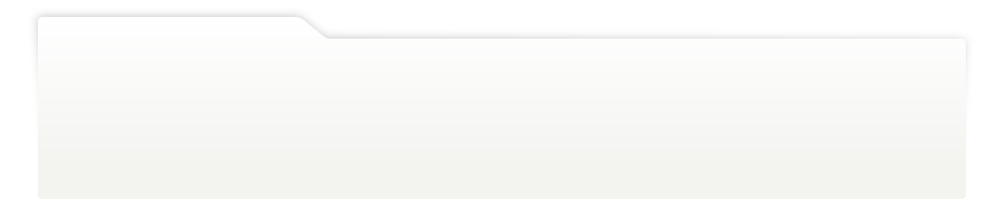
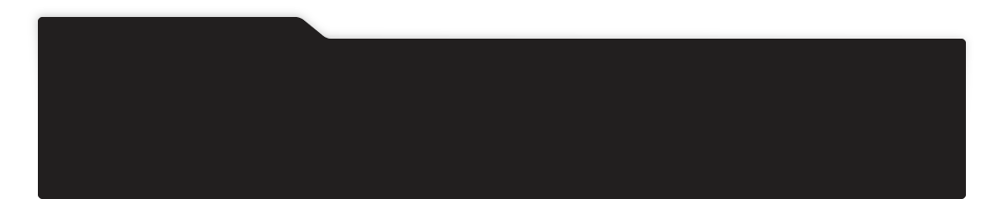
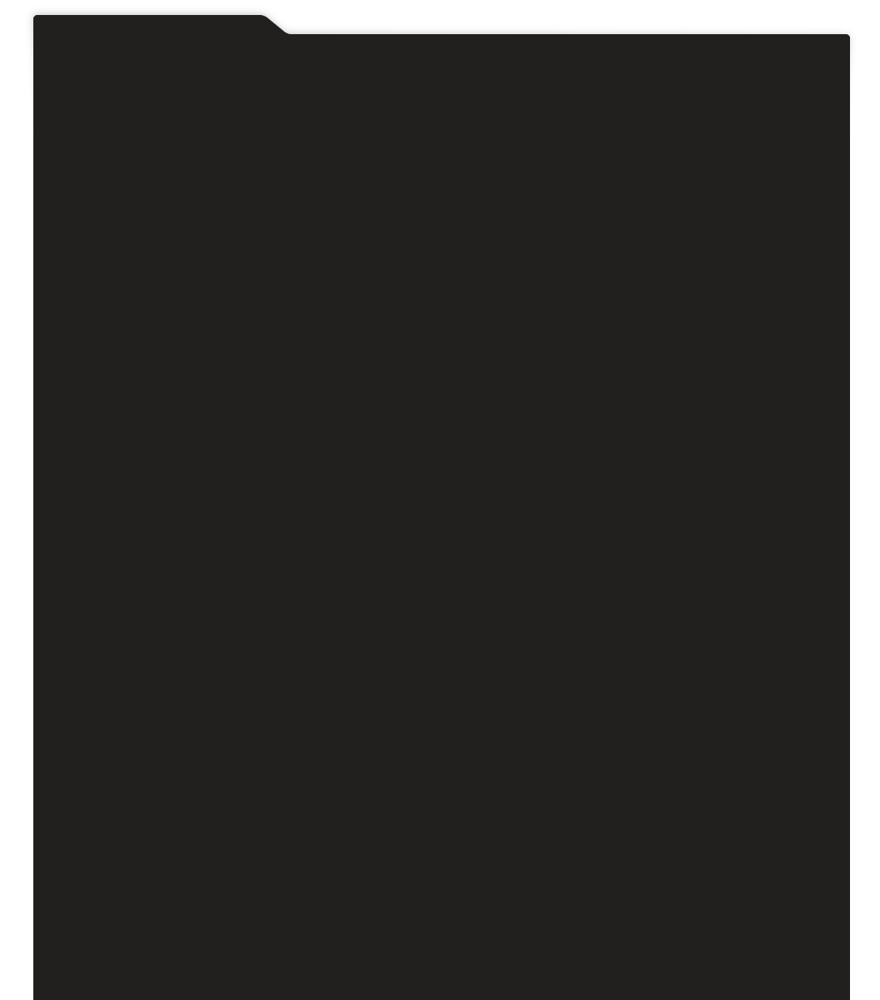
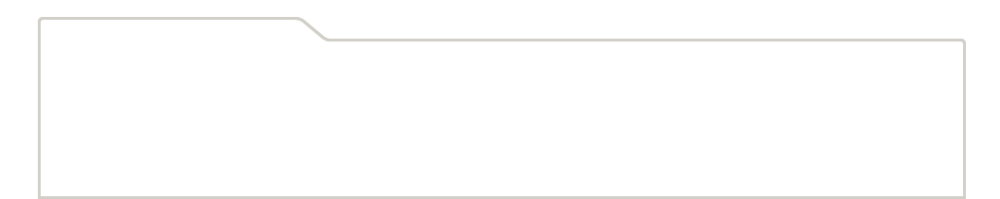
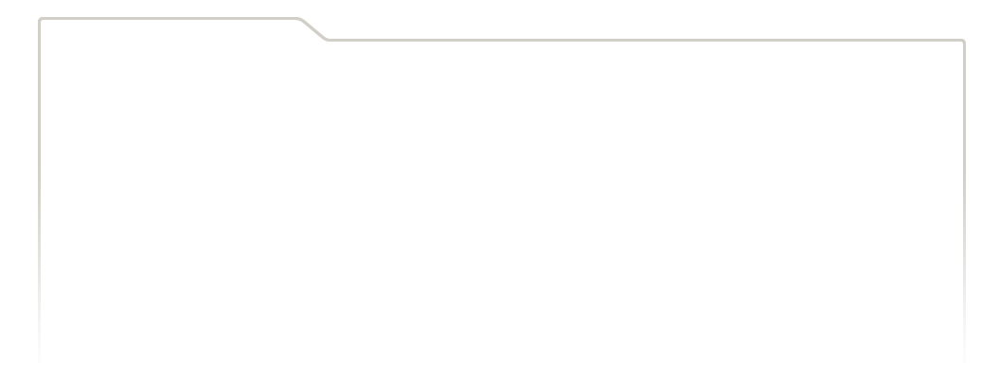
...
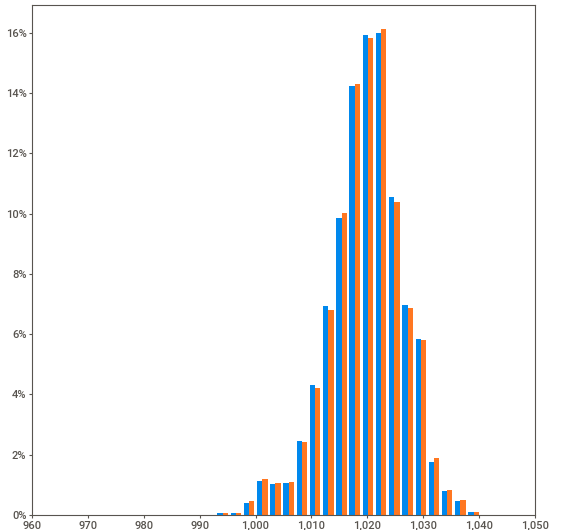
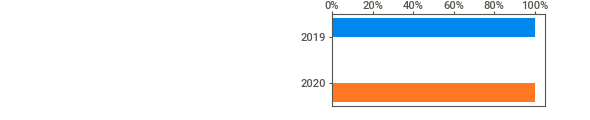
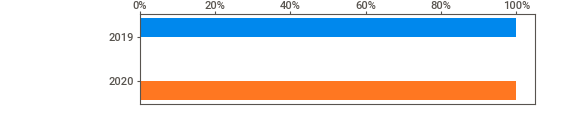
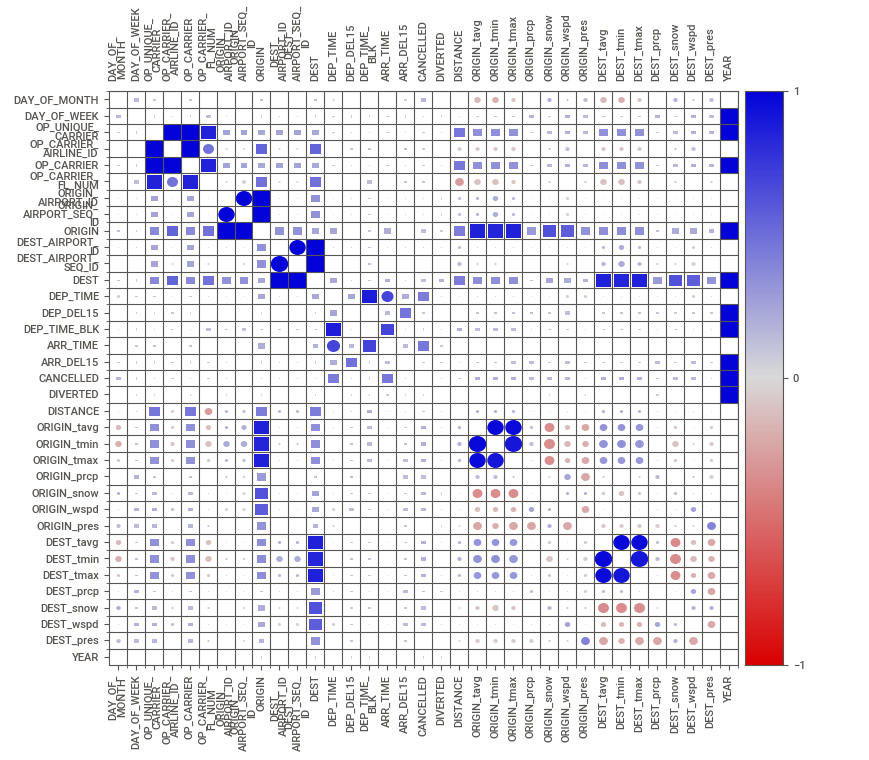
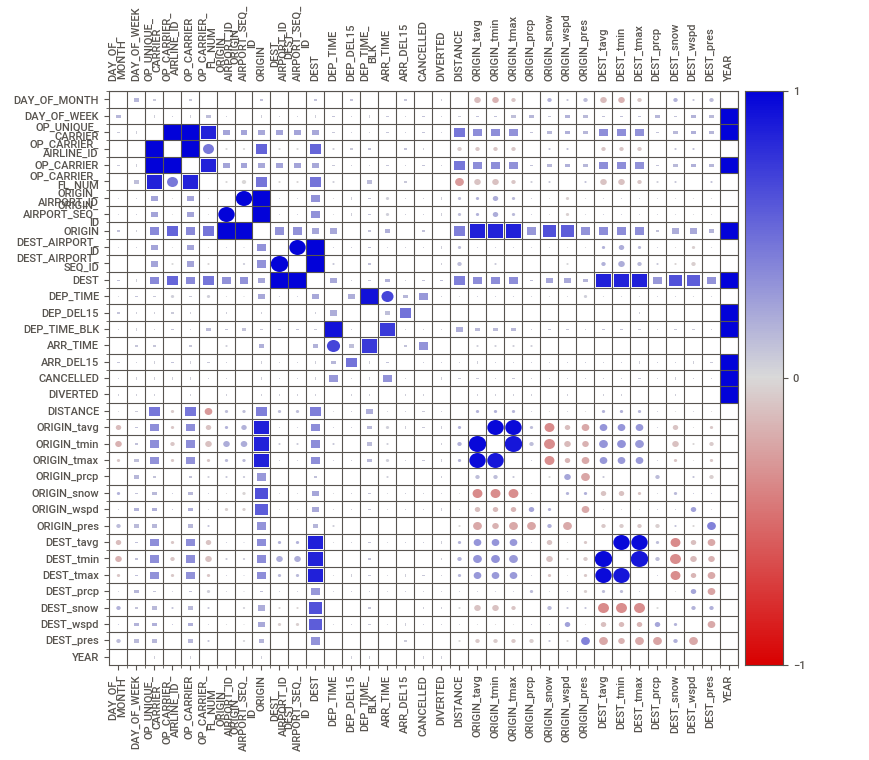

In [5]:
from IPython.display import HTML, display

display(HTML(filename="SWEETVIZ_REPORT.html"))

The visualisations provided by SweetViz give a really good overview of what the datasets look like as it independently displays a comparison of each feature from the datasets. Thanks to these graphs, we are able to set which will be the research questions that will be studied in the exploratory analysis.


By looking into the report, the features of DAY_OF_MONTH and DAY_OF_WEEK are displayed in the fist place. It can be seen that there is a similar percentage of records per each day of the month, although the last day of January experiences an increase in the number of records, as well as per each day of the week. Hence, it will be interesting to explore what are the significant days regarding delays and cancellations in order to find if there is a relationship between these features.


In addition, by looking into the different variables in OP_UNIQUE_CARRIER of January 2019 and January 2020, it can be appreciated that the same airlines are in charge of operating the flights in both datasets. There are few airlines that operated a higher number of flights than the rest, but most of the airlines have similar numbers. Therefore, in the exploratory analysis we will study the likelihood of a flight being delayed or cancelled depending on the airline/carrier.


Furthermore, by looking into the airports in ORIGIN and DESTINATION, it is observed that the airports with the highest percentage of total flights are the same ones in both datasets. Also, the percentage of flights per airport is very similar for all of them. Hence, we will look into which are the airports that are most likely to have their flights cancelled.


Moreover, thanks to the fact that the datasets provide information regarding where the flight starts and where it finishes, it will be of a huge importance to determine which are the routes that perform the worst, namely, which are the ones that have a higher number of cancellations and delays.


By adding the weather data of the origin and destination airports into the provided datasets and thanks to the visualizations displayed on Sweetviz, we can see that the weather conditions vary considerably from year to year. Therefore, in the exploratory analysis if the weather conditions have an impact on the airlines activities and, if so, what are the most relevant conditions.


## Routes exploration

The preliminary inspection of data has been highly rewarding since it allowed to formulate interesting research questions which, in its own way, serve insightful business value.

The following section addresses which **routes are prone to cancel or be delayed** in order to avoid these for future business trips. In knowing this, companies can reschedule accordingly or plan the travelling through other flights or other means of transport.

it is going to be found out which routes are the worst for each of the analysed years - 2019 and 2020 - in absolute and relative numbers, and a geaographical plot is going to be displayed to ease the analysis.

Firstly, the route feature is added to our datasets:

In [6]:
# Define the "Route" feature
df20_raw["route"] = df20_raw["ORIGIN"] + "_" + df20_raw["DEST"]
df19_raw["route"] = df19_raw["ORIGIN"] + "_" + df19_raw["DEST"]
df_all = df19_raw.append(df20_raw)
df_all['route'].head(5)

0    GNV_ATL
1    GNV_ATL
2    GNV_ATL
3    GNV_ATL
4    MSP_ATL
Name: route, dtype: object

As a first analysis, we look into the normalized cancellations per route to see if there are any alarming values.

In [7]:
#Percentual cancellations per route
can_route_per_19 = df19_raw.groupby("route")["CANCELLED"].value_counts(normalize = True) * 100
print("Percentual cancellations per route: Least to Most 2019")
can_route_per_19.sort_values(ascending = False)

Percentual cancellations per route: Least to Most 2019


route    CANCELLED
YUM_PHX  0.0          100.000000
LAX_OGG  0.0          100.000000
LAX_SUN  0.0          100.000000
LAX_SGU  0.0          100.000000
LAX_SGF  0.0          100.000000
                         ...    
LAX_DFW  1.0            0.171821
SEA_LAS  1.0            0.168350
SLC_DEN  1.0            0.165289
DEN_SLC  1.0            0.165017
ATL_MCO  1.0            0.124378
Name: CANCELLED, Length: 8371, dtype: float64

In [8]:
#Percentual cancellations per route
can_route_per_20 = df20_raw.groupby("route")["CANCELLED"].value_counts(normalize = True)*100
print("Percentual cancellations per route: Least to Most 2020")
can_route_per_20.sort_values(ascending = False)

Percentual cancellations per route: Least to Most 2020


route    CANCELLED
YUM_PHX  0.0          100.000000
JFK_ABQ  0.0          100.000000
IND_LAX  0.0          100.000000
IND_LGA  0.0          100.000000
IND_MIA  0.0          100.000000
                         ...    
ATL_FLL  1.0            0.127714
FLL_ATL  1.0            0.127226
MCO_ATL  1.0            0.121065
HNL_OGG  1.0            0.106157
LAX_JFK  1.0            0.097656
Name: CANCELLED, Length: 7943, dtype: float64

At the moment there are no alarming values to point out. Let's dive deeper into the research question looking at the most cancelling routes.

As a first analysis, we look into the normalized cancellations per route to see if there are any alarming values.

In [9]:
#Percentual cancellations per route
del_route_per_19 = df19_raw.groupby("route")["ARR_DEL15"].value_counts(normalize = True) * 100
print("Percentual arrivals delayed per route: Least to Most 2019")
del_route_per_19.sort_values(ascending = False)

Percentual arrivals delayed per route: Least to Most 2019


route    ARR_DEL15
BWI_SJC  0.0          100.000000
TPA_SDF  0.0          100.000000
TPA_SFO  0.0          100.000000
SJC_BHM  0.0          100.000000
SMF_HOU  0.0          100.000000
                         ...    
SAT_BWI  1.0            1.785714
FAT_PDX  1.0            1.785714
SJC_TUS  1.0            1.724138
CPR_SLC  1.0            1.612903
SMF_IAH  1.0            1.562500
Name: ARR_DEL15, Length: 10757, dtype: float64

In [10]:
#Percentual cancellations per route
del_route_per_20 = df20_raw.groupby("route")["ARR_DEL15"].value_counts(normalize = True)*100
print("Percentual arrivals delayed per route: Least to Most 2020")
del_route_per_20.sort_values(ascending = False)

Percentual arrivals delayed per route: Least to Most 2020


route    ARR_DEL15
LAS_CID  0.0          100.000000
MDT_IAD  0.0          100.000000
MDW_BUR  0.0          100.000000
PIE_ROA  0.0          100.000000
RAP_LAS  0.0          100.000000
                         ...    
PIT_BWI  1.0            1.639344
BOI_PDX  1.0            1.612903
BOI_OAK  1.0            1.612903
OGG_ITO  1.0            1.612903
PVD_ATL  1.0            1.234568
Name: ARR_DEL15, Length: 11010, dtype: float64

With the first glance it is noticeable that the routes that have the least arrivals delayed do have a slightly smaller percentage of delays than the equivalent for cancellations. In any case, there are no alarming values to point out. It's time to dive deeper into the research question looking at the routes with the most arrivals delayed. But first, some preparation needs to be done.

### Preparation of plots


To properly make geographical plots and plot the absolute as well as relative number of flights cancelled per route, the code is going to be defined into functions for reusability purposes.

PS: Thanks to *Bob Haffner* for inspiration on plotting https://stackoverflow.com/questions/56550313/how-to-plot-routes-between-pairs-of-starting-and-ending-geospatial-points-using

In [12]:
airports = pd.concat([df_all.ORIGIN, df_all.ORIGIN, df_all.DEST, df_all.DEST]).unique()
# https://datahub.io/core/airport-codes
df_geo = pd.read_csv('airport-codes.csv')

In [13]:
# Get coordinates for the airports in the dataset
coords = df_geo[df_geo.iata_code.isin(airports)][['iata_code', 'coordinates', 'elevation_ft']]

In [14]:
# Separate longitude and latitude and dtypes
coords['lng'] = coords.coordinates.apply(lambda x: x.split(',')[0]).astype(float)
coords['lat'] = coords.coordinates.apply(lambda x: x.split(',')[1]).astype(float)

In [15]:
# Drop old coordinate column
coords = coords.drop(['coordinates', "elevation_ft"], axis=1)
coords.columns

Index(['iata_code', 'lng', 'lat'], dtype='object')

The function below plots horizontal bar charts in the same cell. Quite handy.

In [16]:
def plot_barh(df1, df2, title1, title2):
    fig, axs = plt.subplots(1,2, figsize=(15,6))

    sns.barplot(x = df1.values, 
                y = df1.index,
                orient = "h",
                order = df1.index,
                ax=axs[0]).set(title = title1)

    sns.barplot(x = df2.values, 
                y = df2.index,
                orient = "h",
                order = df2.index,
                ax=axs[1]).set(title = title2)

A function is needed to put it all together, our previously used data with some weather features together with the geographical data.

In [17]:
def prepare_geo(df, coords):
    geo_inter = pd.merge(df, coords, left_on = "ORIGIN", right_on ="iata_code", how = "left")
    geo_final = pd.merge(geo_inter, coords, left_on = "DEST", right_on ="iata_code", how = "left", suffixes = ("_origin", "_destination"))
    geo_final = geo_final.drop(["iata_code_origin", "iata_code_destination"], axis= 1)
    return geo_final

The following function plots the map centered in the average coordinates of the routes to be plotted and then plots the airports and the routes, all in colorblind-friendly colors. The function restricts the plotting to the worst airports, and plots with more intensity the most occuring cancelled routes.

In [18]:
def plot_map(df_1, df_2, top_1, top_2):
     #Set center of map for plotting
    centroid_lat = (df_1["lat_origin"].mean() + df_1["lat_destination"].mean()) / 2
    centroid_lng = (df_1["lng_origin"].mean() + df_1["lng_destination"].mean()) / 2
    df_plot1 = df_1[df_1['route'].isin(top_1.index)] 
    df_plot2 = df_2[df_2['route'].isin(top_2.index)] 
    m = folium.Map([centroid_lat, centroid_lng], zoom_start=3)
    
    # Plot 1st Year
    for _, row in df_plot1.iterrows():
        folium.CircleMarker([row['lat_origin'], row['lng_origin']],
                            radius=10,
                            color="white", # divvy color
                            opacity = 0.8,
                            weight =1.5,
                           ).add_to(m)

        folium.CircleMarker([row['lat_destination'], row['lng_destination']],
                            radius=10,
                            color="black", # divvy color
                            opacity = 0.5,
                            weight =3.5,
                           ).add_to(m)

        folium.PolyLine([[row['lat_origin'], row['lng_origin']], 
                         [row['lat_destination'], row['lng_destination']]],
                         opacity = 1, color="blue").add_to(m)
    
    # Plot 2nd Year
    for _, row in df_plot2.iterrows():
        folium.CircleMarker([row['lat_origin'], row['lng_origin']],
                            radius=10,
                            color="white", # divvy color
                            opacity = 0.8,
                            weight =1.5,
                           ).add_to(m)

        folium.CircleMarker([row['lat_destination'], row['lng_destination']],
                            radius=10,
                            color="black", # divvy color
                            opacity = 0.5,
                            weight =3.5,
                           ).add_to(m)

        folium.PolyLine([[row['lat_origin'], row['lng_origin']], 
                         [row['lat_destination'], row['lng_destination']]],
                         opacity = 0.2, color="orange", weight = 1.5).add_to(m)
    return m

### Cancellations

Having defined the functions needed, it´s time to look at the cancelled routes. First, let's take a look at the most (absolute) cancelled routes:

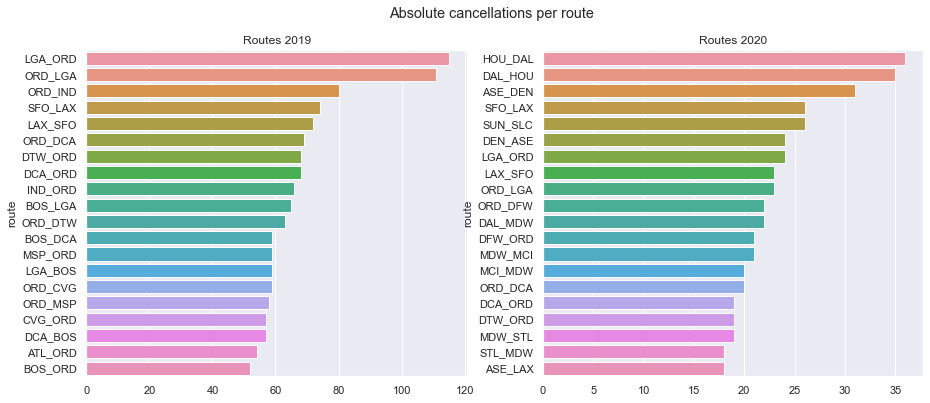

In [19]:
can_route_19 = df19_raw.groupby("route")["CANCELLED"].sum().sort_values(ascending = False)
top_2019 = can_route_19[:20]
can_route_20 = df20_raw.groupby("route")["CANCELLED"].sum().sort_values(ascending = False)
top_2020 = can_route_20[:20]

plot_barh(top_2019, top_2020, "Routes 2019", "Routes 2020")
plt.suptitle('Absolute cancellations per route')
plt.show()

Looking at the above plots it´s interesting that some of this routes are all from 11 and 15 airports respectively. This is very locallised and in some cases the same route was cancelled in both directions, such as LAX-SFO or ORD-IND, for instance. This can only make one think there might be some unique events that drove the cancellations. This will be looked into later in the otehr research questions.

Moreover, it can be seen that the North East (Illinois, New York, Indiana, Virginia...) of the US has a big concentration of the cancellations in absolute terms.

Now let's take a look at the most cancelling routes relative to the number of flights they operate. In other words, the routes with the highest probability (from a frequentist point of view) of being cancelled.

This can be certainly insightful as it allows to check if the above mentioned routes are in fact the worst with regards to cancellations or are simply the most popular routes. 

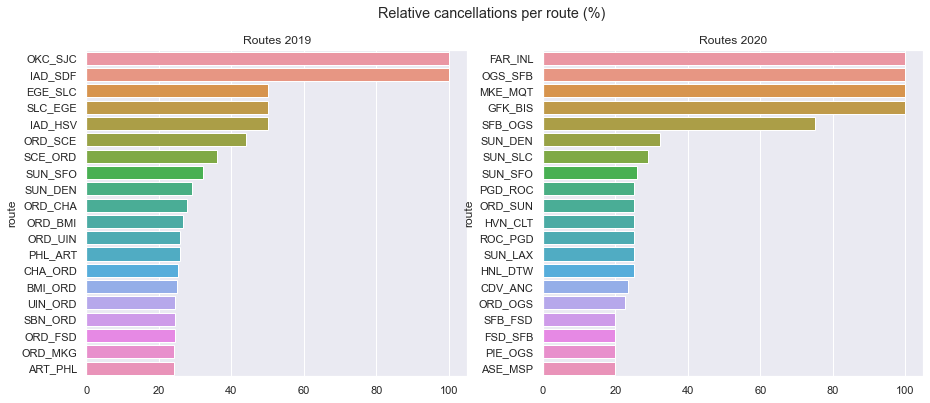

In [20]:
can_route_per_19 = (df19_raw.groupby("route")["CANCELLED"].sum() / df19_raw.groupby("route")["CANCELLED"].count()*100).sort_values(ascending = False)
top_per_2019 = can_route_per_19[:20]
can_route_per_20 = (df20_raw.groupby("route")["CANCELLED"].sum() / df20_raw.groupby("route")["CANCELLED"].count()*100).sort_values(ascending = False)
top_per_2020 = can_route_per_20[:20]

plot_barh(top_per_2019, top_per_2020, "Routes 2019", "Routes 2020")
plt.suptitle('Relative cancellations per route (%)')
plt.show()

The results are quite surprising... Relative to the total number of flights, almost none of the previously analysed routes are the worst.

While the airports with the most cancelled routes in absolute terms are (mostly) important hubs or at least big cities, the airports considered in the worst routes above are not only big transport hubs but also regional airports with low transit during the winter months - and higher chances of cancelling flights. 

There are no time patterns, although there are routes cancelled concerning the same regional airports in both years. This is the case of SUN, Friedman Memorial Airport, in the state of Idaho.

Regarding the hubs, the most notable ones are ORD, from Chicago as well as SFO, from San Francisco. This airports have several routes with a great proportion of cancellations although they are ones of the most transitted airports in the US, which makes it reasonable that they have so many cancellations.

It can be insightful to visually see the most-cancelling routes in the map. This will allow to better locate the cancelling routes.

Therefore, the datasets are prepared and plotted in the next cells.

In [21]:
geo_19 = prepare_geo(df19_raw, coords)
geo_20 = prepare_geo(df20_raw, coords)

With the above defined function **plot_map**, we can see the most-cancelling routes for 2019 and 2020. 

Regarding the plot, the white circles represent the origin whereas the black circles represent the destinations. Moreover, the <font color = "blue">blue lines represent the 2019 </font> cancelled flights while the <font color = "orange">orange lines represent the 2020</font> cancelled flights.

To fully understand the plot, it is important to notice that the more cancellations, the more intense the colors are.

In [22]:
plot_map(geo_19, geo_20, top_per_2019, top_per_2020)

The map is interactive, so feel free to zoom in or out and, for instance, get a closer look around Chicago - the Great lakes region.

At first glance it is remarkable that the cancelled flights during January 2019 were much more condensed than the equivalent in 2020. There are less airports involved and there are quite some cases with same route in both directions. 

It is observable that most of the routes do not have the same issues in 2019 than in 2020, which makes it harder to estimate which routes will cancel the next year looking at historical data. Moreover, it is quite noticeable that, most of the airports are in grey, this is, they are departure and arrival.

All in all, there are no atemporal patterns that could be derived from looking at the trends. However, it can be very helpful when planning a business trip to consider whether to use one of the routes plotted, especially when involving regional airports.

### Delays

Having derived the insights for the cancelled routes, it's time to look at the delays. First, let's take a look at the most (absolute) delayed routes:

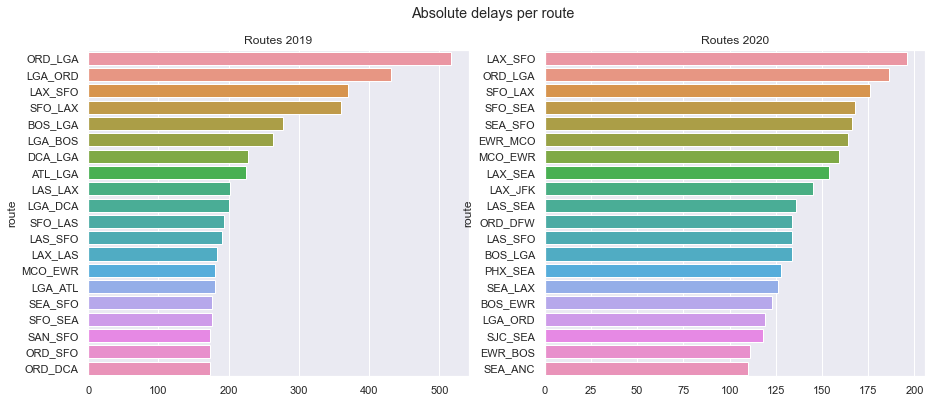

In [23]:
del_route_19 = df19_raw.groupby("route")["ARR_DEL15"].sum().sort_values(ascending = False)
del_2019 = del_route_19[:20]
del_route_20 = df20_raw.groupby("route")["ARR_DEL15"].sum().sort_values(ascending = False)
del_2020 = del_route_20[:20]

plot_barh(del_2019, del_2020, "Routes 2019", "Routes 2020")
plt.suptitle('Absolute delays per route')
plt.show()

In [24]:
del_total_19 = df19_raw["ARR_DEL15"].sum()
del_total_20 = df20_raw["ARR_DEL15"].sum()
print("Total delays in 2019: ", del_total_19," Total delays in 2020: ", del_total_20)

del_top_19 = del_2019.sum()
del_top_20 = del_2020.sum()
print("Worst route delays in 2019: ", del_top_19,"Worst route delays in 2020: ", del_top_20)

Total delays in 2019:  105222.0  Total delays in 2020:  82106.0
Worst route delays in 2019:  4870.0 Worst route delays in 2020:  2887.0


Looking at the above plots it´s interesting that some of this routes are all from 9 and 11 airports respectively. this means that only 9 airports (in 2019) account for the 20 most delayed routes, which is a high concentration. 

Moreover, it can be seen that, more precisely than in the cancellations analysis, it is the bigger hubs that account for the most delays. This is the case of New York, Chicago, San Francisco or Seattle, for instance.

Now let's take a look at the most delayed routes relative to the number of flights they operate. In other words, the routes with the highest probability (again, from a frequentist point of view) of being delayed.

This can be certainly insightful to prove that hubs are prone to have routes delayed. 

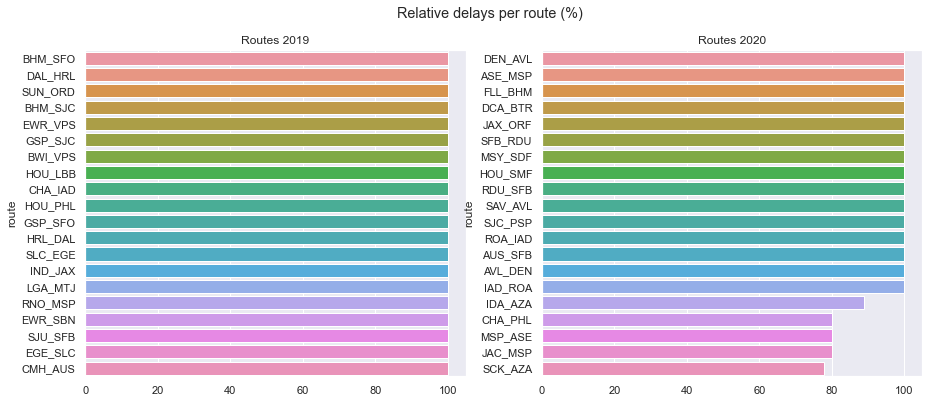

In [25]:
del_route_per_19 = (df19_raw.groupby("route")["ARR_DEL15"].sum() / df19_raw.groupby("route")["ARR_DEL15"].count()*100).sort_values(ascending = False)
del_per_2019 = del_route_per_19[:20]
del_route_per_20 = (df20_raw.groupby("route")["ARR_DEL15"].sum() / df20_raw.groupby("route")["ARR_DEL15"].count()*100).sort_values(ascending = False)
del_per_2020 = del_route_per_20[:20]

plot_barh(del_per_2019, del_per_2020, "Routes 2019", "Routes 2020")
plt.suptitle('Relative delays per route (%)')
plt.show()

The results are breathtaking... Relative to the total number of flights, almost none of the previously analysed routes are the worst, same as for cancellations.

The rate of routes delayed for 2019 is cerntainly high, with the top 20 routes having every flight delayed. As per 2020, the rates are not as hight though they are far from low, with only four routes down to almost 80%.

Regarding the hubs, the most notable ones are HOU as well as DAL, from Texas, but only for 2019. There are no airports that seem to have an intrinsic problem with delays in 2020.

It can be insightful to visually see the most-delayed routes in the map. This will allow to better locate the delaying routes.

Therefore, the datasets are prepared and plotted in the next cells.

In [26]:
geo_19 = prepare_geo(df19_raw, coords) #Cell repeated for story-telling purposes
geo_20 = prepare_geo(df20_raw, coords)

With the above defined function **plot_map**, we can see the most-delaying routes for 2019 and 2020. 

Regarding the plot, the white circles represent the origin whereas the black circles represent the destinations. Same as in Cancellations, the <font color = "blue">blue lines represent the 2019</font> delayed flights while the <font color = "orange">orange lines represent the 2020</font> delayed flights.

To fully understand the plot, it is important to notice that the more delays, the more intense the colors are.

In [27]:
plot_map(geo_19, geo_20, del_per_2019, del_per_2020)

The map is interactive, so feel free to zoom in or out and, for instance, get a closer look around Chicago - the Great lakes region.

At first glance it is remarkable that the cancelled flights during January 2019 were much more condensed than the equivalent in 2020. There are less airports involved and there are quite some cases with same route in both directions. 

It is observable that most of the routes do not have the same issues in 2019 than in 2020, which makes it harder to estimate which routes will cancel the next year looking at historical data. Moreover, it is quite noticeable that, most of the airports are in grey, this is, they are departure and arrival.

Closing the routes topic: **Are there any routes that are more prone to have flights delayed or cancelled?** 

It seems both in terms of cancellations and delays, this is not strictly the case. Routes that include a small regional airport, or airports that are in colder regions tend to have a lot of delays and cancellations, though the following is not true for all routes regarding these airports. Moreover, big hubs do have a bigger number of cancellations, but this is only due to the fact that there are a whopping number of flights coming out and to these airports (this is the case of LGA in New York or SFO in San Francisco, for instance).

There are no atemporal patterns that could be derived from looking at the trends. This research question could be indeed helpful when planning a business trip to consider whether to use one of the routes plotted, especially when involving regional airports.

Thus, overall, there is no strong correlation between given routes and cancellations or delays, but there are routes within specific airports, displayed in the geographical maps, that businesses should be wary of.

## Airlines and carriers exploration

This section wishes to answer the following question: **Are there any airlines that are most likely to have their flights delayed or cancelled?**

In order to answer this question, the analysis will be focused on developing visualisations that will help us find a relationship between the different airlines and wether they have a higher number of flights that are being delayed or cancelled. Hence, the January 2019 and January 2020 datasets will be compared.

As we want to have the highest amount of data possible regarding delays and cancellations and this part of the exploratory analysis is only focused on the airlines/carriers, the datasets that do not contain weather data will be used since they have a higher number of rows.

### Departure Delays

The possible relationship between the delays and airlines will be first explored in this part of the analysis. As a first approach, the number of total flights per airline as well as the number of delayed flights will be visualized.

Starting with January 2019, the total number of flights and the delayed ones will be put side by side to compare them.

In [28]:
df_airlines_d19_count = df19_raw.groupby('OP_CARRIER')['DEP_DEL15'].count().sort_values(ascending = False)
df_airlines_d19 = df19_raw.groupby('OP_CARRIER')['DEP_DEL15'].sum().sort_values(ascending = False)

In [29]:
#Function used to visualizing two plots at the same time
def plot_bar(df1, df2, title1, title2):
    fig, axs = plt.subplots(1,2, figsize=(15,6))

    sns.barplot(x = df1.index, 
                y = df1.values, 
                order = df1.index,
                ax=axs[0]).set(title = title1)

    sns.barplot(x = df2.index, 
                y = df2.values, 
                order = df2.index,
                ax=axs[1]).set(title = title2)


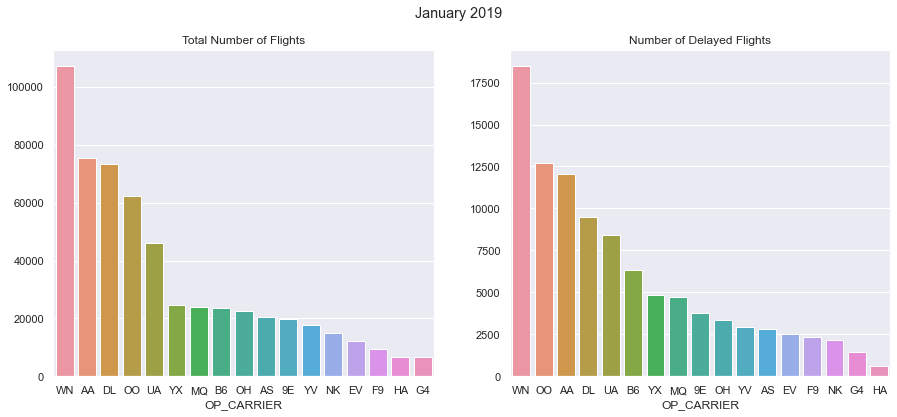

In [30]:
plot_bar(df_airlines_d19_count, df_airlines_d19, "Total Number of Flights", "Number of Delayed Flights")
plt.suptitle('January 2019')
plt.show()


It can be seen that in almost all cases, that the airlines with the highest number of flights are also the ones with the highest number of delays. 

We will now see if this trend is also followed in January 2020.

In [31]:
df_airlines_d20_count = df20_raw.groupby('OP_CARRIER')['DEP_DEL15'].count().sort_values(ascending = False)
df_airlines_d20 = df20_raw.groupby('OP_CARRIER')['DEP_DEL15'].sum().sort_values(ascending = False)

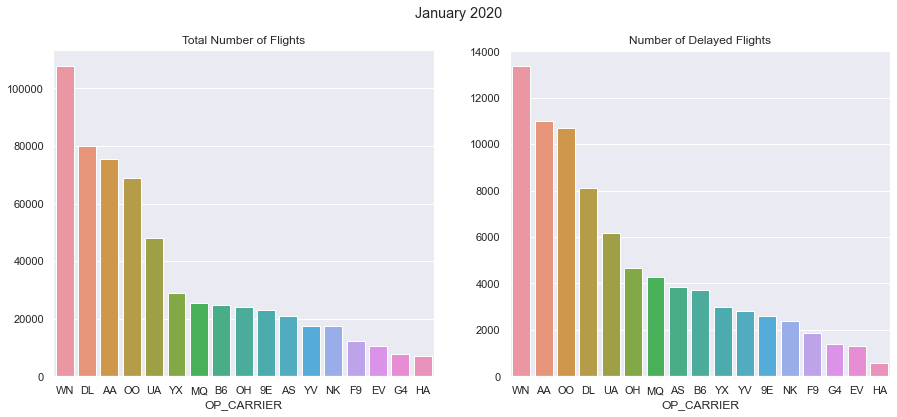

In [32]:
plot_bar(df_airlines_d20_count, df_airlines_d20, "Total Number of Flights", "Number of Delayed Flights")
plt.suptitle('January 2020')
plt.show()

The same happens for January 2020. So, for both years, the airlines that have the highest number of delayed flights correspond to the ones that have the highest number of flights in total. Therefore, a different approach is taken, so as to find which carriers have a higher probability of flight delay not based on absolute numbers but on percentage.

In [33]:
df_airlines_d19per = df_airlines_d19.div(df_airlines_d19_count)*100
df_airlines_d19per = df_airlines_d19per.sort_values(ascending = False)

df_airlines_d20per = df_airlines_d20.div(df_airlines_d20_count)*100
df_airlines_d20per = df_airlines_d20per.sort_values(ascending = False)

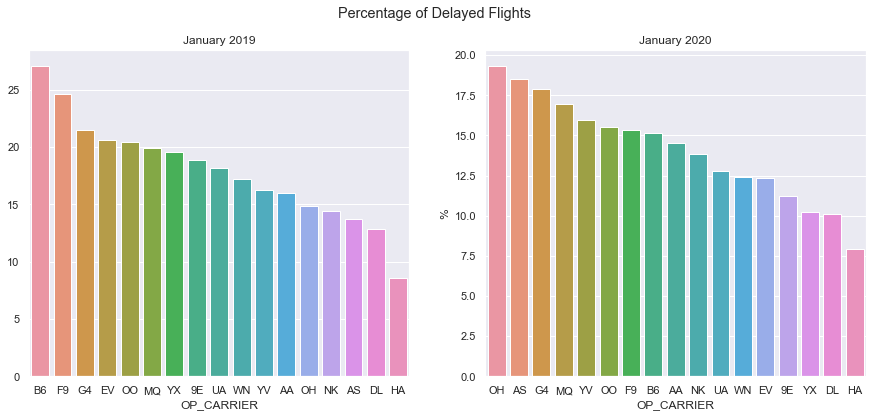

In [34]:
plot_bar(df_airlines_d19per, df_airlines_d20per, "January 2019", "January 2020")
plt.ylabel("%")
plt.suptitle('Percentage of Delayed Flights')
plt.show()

As seen in the displayed graphs, in most cases, the percentage of delayed flights per airline varies very notably comparing January 2019 and January 2020. Only the carriers DL and HA remain in their position as the airlines with the lowest percentage of delayed flights. 

In order to gain insights regarding how the amount of delayed flights varies per airliens through time, the following graphs are displayed for January 2019 and January 2020:

In [35]:
daycount19 = df19_raw.groupby(['DAY_OF_MONTH','OP_CARRIER'])['DEP_DEL15'].sum()
df19_daycount = pd.DataFrame(daycount19)
df19_daycount.reset_index(inplace=True)  

In [36]:
alt.Chart(df19_daycount).mark_area().encode(
    alt.X('DAY_OF_MONTH',
        axis=alt.Axis(domain=False, tickSize=0)
    ),
    alt.Y('DEP_DEL15', stack='center'),
    alt.Color('OP_CARRIER',
        scale=alt.Scale(scheme='category20b')
    )
).interactive().properties(title = '2019 Daily Number of Delays per Airline')

alt.Chart(...)

In [37]:
daycount20 = df20_raw.groupby(['DAY_OF_MONTH','OP_CARRIER'])['DEP_DEL15'].sum()
df20_daycount = pd.DataFrame(daycount20)
df20_daycount.reset_index(inplace=True)  

In [38]:
alt.Chart(df20_daycount).mark_area().encode(
    alt.X('DAY_OF_MONTH',
        axis=alt.Axis(domain=False, tickSize=0)
    ),
    alt.Y('DEP_DEL15', stack='center'),
    alt.Color('OP_CARRIER',
        scale=alt.Scale(scheme='category20b')
    )
).interactive().properties(title = '2020 Daily Number of Delays per Airline')

alt.Chart(...)

As seen in the graphs, there are certain days when the number of delayed flights of most of the airlines experience a huge spike. Hence, the delayes are more related to the circustances of a certain day rather than to the carriers themselves

### Cancellations

The possible relationship between cancellations and airlines is now explored in this part of the analysis.

The same reasoning as in the section above is followed. Therefore, in oreder to determine this possible relationship we will look directly into the cancellation percentage for each carrier for both years rather than to the absolute numbers.

In [39]:
df_airlines_d19_cancelled = df19_raw.groupby('OP_CARRIER')['CANCELLED'].sum().sort_values(ascending = False)
df_airlines_d19_cancelled = df_airlines_d19_cancelled.div(df_airlines_d19_count)*100
df_airlines_d19_cancelled = df_airlines_d19_cancelled.sort_values(ascending = False)

df_airlines_d20_cancelled =  df20_raw.groupby('OP_CARRIER')['CANCELLED'].sum().sort_values(ascending = False)
df_airlines_d20_cancelled = df_airlines_d20_cancelled.div(df_airlines_d20_count)*100
df_airlines_d20_cancelled = df_airlines_d20_cancelled.sort_values(ascending = False)

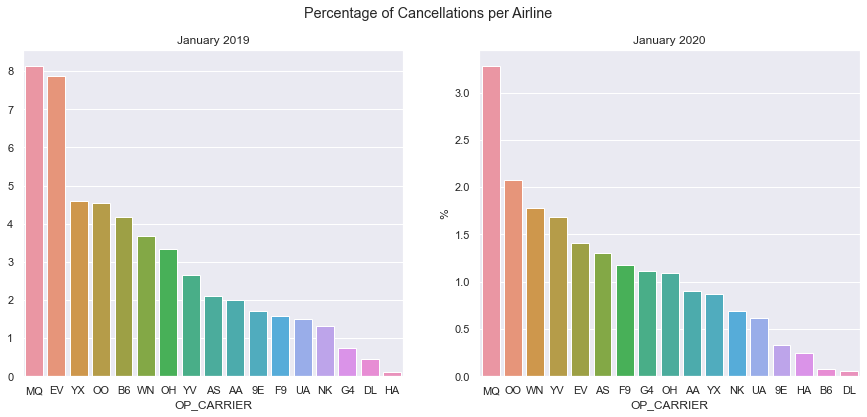

In [40]:
plot_bar(df_airlines_d19_cancelled, df_airlines_d20_cancelled, "January 2019", "January 2020")
plt.ylabel("%")
plt.suptitle("Percentage of Cancellations per Airline")
plt.show()

Looking at the charts above, the percentages of cancellations from year to year varies a lot as the highest values for 2019 are around 8% of cancellations and above 3% for 2020. Furthermore, apart from the airline MQ which remains as the carrier with the highest perentage of cancellations, in most of the cases the percentage of cancellations per airline have a very big variation comparing both years.

In order to gain insights regarding how the amount of cancelled flights varies per airliens through time, the following graphs are displayed for January 2019 and January 2020:

In [41]:
daycount19C = df19_raw.groupby(['DAY_OF_MONTH','OP_CARRIER'])['CANCELLED'].sum()
df19_daycountC = pd.DataFrame(daycount19C)
df19_daycountC.reset_index(inplace=True)  

In [42]:
alt.Chart(df19_daycountC).mark_area().encode(
    alt.X('DAY_OF_MONTH',
        axis=alt.Axis(domain=False, tickSize=0)
    ),
    alt.Y('CANCELLED', stack='center'),
    alt.Color('OP_CARRIER',
        scale=alt.Scale(scheme='category20b')
    )
).interactive().properties(title = '2019 Daily Number of Cancellations per Airline')

alt.Chart(...)

In [43]:
daycount20C = df20_raw.groupby(['DAY_OF_MONTH','OP_CARRIER'])['CANCELLED'].sum()
df20_daycountC = pd.DataFrame(daycount20C)
df20_daycountC.reset_index(inplace=True)  

In [44]:
alt.Chart(df20_daycountC).mark_area().encode(
    alt.X('DAY_OF_MONTH',
        axis=alt.Axis(domain=False, tickSize=0)
    ),
    alt.Y('CANCELLED', stack='center'),
    alt.Color('OP_CARRIER',
        scale=alt.Scale(scheme='category20b')
    )
).interactive().properties(title = '2020 Daily Number of Cancellations per Airline')

alt.Chart(...)

As seen in the charts for both years, there are certain days when the number of cancelled flights a lot of airlines experience a huge spike spike at the same time.

In conclusion, answering the question:  **Are there any airlines that are most likely to have their flights delayed or cancelled?** 

No, it cannot be stated that there is a link between the likelihood of a flight being cancelled or delayed by the fact of being from one airline or another. As it was showed in the analysis, there is a lot of variation to the percentage of delayed flights for the different carriers from January 2019 to January 2020. Furthermore, as visualized in the charts displaying how the number of delays and cancellations varied through time per each airline, it was clear that there are certain days where most of the airlines experience a big increase in these numbers. In the following section of the exploratory analysis more insights regarding the time and cancellations and delays will be studied.

## Impact of days of the week on cancellations and delays

This section aims to answer the research question: **Does flying on a specific day of the week mean that flights are more likely to be delayed or cancelled?**

To answer this question, we will examine the data from both January 2019 and 2020 and try to spot any trends that we could draw conclusions from. We will also develop visualisations that will help us get a better understanding of the data.

### 2019

Lets first analyze delayed flights in January 2019. Which days of the week have the most delays?

In [45]:
df19_raw[['DAY_OF_WEEK','ARR_DEL15','DEP_DEL15']].groupby('DAY_OF_WEEK').sum().sort_values(by='ARR_DEL15',ascending=False)

,ARR_DEL15,DEP_DEL15
DAY_OF_WEEK,,
4,20249.0,19111.0
3,18082.0,16860.0
2,15059.0,14358.0
5,14430.0,13565.0
1,14350.0,13600.0
7,13410.0,12600.0
6,9642.0,8833.0


When we sum all the delays within January 2019 per week day, Thursdays, Wednesdays and Tuesdays accumulated the most delays. However, when we look at the calendar, January 2019 had 5 Tuesdays, Wednesdays and Thursdays and 4 Mondays, Fridays, Saturdays and Sundays. Dividing the sums by the amount of occurences in a week day in the month would thus give us an average number of delays per weekday and provide a better sense of whether a specific week day had more delays than others.

In [46]:
week19_del_4days = df19_raw[['DAY_OF_WEEK','ARR_DEL15','DEP_DEL15']].groupby('DAY_OF_WEEK').sum().loc[[1,5,6,7]] / 4
week19_del_5days = df19_raw[['DAY_OF_WEEK','ARR_DEL15','DEP_DEL15']].groupby('DAY_OF_WEEK').sum().loc[[2,3,4]] / 5
pd.concat([week19_del_4days,week19_del_5days]).sort_values(by='ARR_DEL15',ascending=False)

,ARR_DEL15,DEP_DEL15
DAY_OF_WEEK,,
4,4049.8,3822.20
3,3616.4,3372.00
5,3607.5,3391.25
1,3587.5,3400.00
7,3352.5,3150.00
2,3011.8,2871.60
6,2410.5,2208.25


We can see that now the order changed slightly and the two week days with the most flights delayed on average are still Thursday and Wednesday. After the division, the average number of delays is now lower for Tuesdays and Fridays jumped up to the top 3 instead. 
<br> It can also be observed (in both of the tables above) that both the sum and the average amount of departure delays is lower compared to arrival delays. 

Lets now look at each day of the month and how the delays look both as a sum of all the delayed flights within that specific day and as a percantage, relative to the total amount of flights in the US on that day:

In [47]:
month19_del = df19_raw[['DAY_OF_MONTH','ARR_DEL15','DEP_DEL15']].groupby('DAY_OF_MONTH').sum()
month19_del['PERCENTUAL_DEP'] = df19_raw.groupby('DAY_OF_MONTH')['DEP_DEL15'].sum()/df19_raw.groupby('DAY_OF_MONTH')['DAY_OF_MONTH'].count()*100
month19_del['PERCENTUAL_ARR'] = df19_raw.groupby('DAY_OF_MONTH')['ARR_DEL15'].sum()/df19_raw.groupby('DAY_OF_MONTH')['DAY_OF_MONTH'].count()*100

In [48]:
print(month19_del.sort_values(by=['ARR_DEL15'],ascending=False))

              ARR_DEL15  DEP_DEL15  PERCENTUAL_DEP  PERCENTUAL_ARR
DAY_OF_MONTH                                                      
24               6084.0     5432.0       27.210339       30.476381
2                5203.0     5075.0       24.896978       25.524922
21               5073.0     4832.0       24.765517       26.000718
23               5037.0     4525.0       23.692340       26.373109
25               4494.0     4281.0       21.361210       22.424031
18               4278.0     3792.0       18.951472       21.380379
17               3947.0     3366.0       16.863727       19.774549
22               3929.0     3763.0       20.169373       21.059120
1                3844.0     3783.0       21.006164       21.344883
6                3790.0     3800.0       19.539284       19.487865
31               3787.0     3881.0       19.441940       18.971045
3                3601.0     3726.0       19.086159       18.445856
30               3451.0     3286.0       17.202387       18.06

Sorted by the arrival delay, in the table we can observe for each day of the month how many flights were delayed each day, both as a sum and as a relative percentage compared to all the flights on that day.
<br> We can observe that there was a lot of flight delays recorded in the period berween 21st - 25th of January. Lets visualize the data in this table with a plot:

In [49]:
dates = pd.date_range("2019-01-01", "2019-01-31", freq="1d")
plot_arrdel_19 = pd.DataFrame({"date": dates, "val": month19_del['ARR_DEL15']})
# plot it. 
fig = go.Figure()
for day_of_week in range(7):
    sub_df = plot_arrdel_19[plot_arrdel_19.date.dt.dayofweek == day_of_week]
    day_name = sub_df.date.dt.day_name().iloc[0]
    fig.add_trace(go.Bar(x=sub_df.date,y=sub_df.val,name=day_name))
fig.update_layout(title_text='Number of flight arrival delays per day in the US - January 2019', title_x=0.5, yaxis_title="Number of flights", legend_title="Days of the week")
fig.show()

dates = pd.date_range("2019-01-01", "2019-01-31", freq="1d")
plot_depdel_19 = pd.DataFrame({"date": dates, "val": month19_del['DEP_DEL15']})
# plot it. 
fig = go.Figure()
for day_of_week in range(7):
    sub_df = plot_depdel_19[plot_depdel_19.date.dt.dayofweek == day_of_week]
    day_name = sub_df.date.dt.day_name().iloc[0]
    fig.add_trace(go.Bar(x=sub_df.date,y=sub_df.val,name=day_name))
fig.update_layout(title_text='Number of flight departure delays per day in the US - January 2019', title_x=0.5, yaxis_title="Number of flights", legend_title="Days of the week")
fig.show()

As the two plots show, the values for both arrival and departure delays are similar and they follow the same trend.
We can also see that Saturdays (coloured in light-blue) are the days where least amount of delays occured.

There is a high amount of delays in the beginning of the year, arount the 1st and 2nd of Jnauary. This could be connected to an increased amount of people travelling after the New Year's Eve and Day, which was on Monday and Tuesday. 
<br>As mentioned before, there a spike of flight delays around 21st - 25th of January. After doing some investigation, from a news report by The Guardian we found out that this was related to the ongoing US government shutdown that caused 800,000 federal employees to be without pay. Among them there were more than 400,000 workers, including air traffic controllers and airport security workers. A lack of Transportation Security Administration officers forced some airports to close terminals. Flights mainly into three US airports were being delayed due to staffing issues, namely in New York, Philadelphia and New Jersey. This caused some arriving flights to be delayed an average of 1 hour and 26 minutes.
<br> https://www.theguardian.com/world/2019/jan/25/flight-delays-laguardia-newark-philadelphia-shutdown

Lets now analyze cancelled flights in January 2019. Which days of the week have the most cancellations?

In [50]:
df19_raw[['DAY_OF_WEEK','CANCELLED']].groupby('DAY_OF_WEEK').sum().sort_values(by='CANCELLED',ascending=False)

,CANCELLED
DAY_OF_WEEK,
3,3392.0
2,2875.0
4,2712.0
1,2413.0
7,2394.0
6,2044.0
5,896.0


Again, we divide the sums by the amount of occurences of a week day in the month:

In [51]:
week19_can_4days = df19_raw[['DAY_OF_WEEK','CANCELLED']].groupby('DAY_OF_WEEK').sum().loc[[1,5,6,7]]/4
week19_can_5days = df19_raw[['DAY_OF_WEEK','CANCELLED']].groupby('DAY_OF_WEEK').sum().loc[[2,3,4]]/5
pd.concat([week19_can_4days,week19_can_5days]).sort_values(by='CANCELLED',ascending=False)

,CANCELLED
DAY_OF_WEEK,
3,678.40
1,603.25
7,598.50
2,575.00
4,542.40
6,511.00
5,224.00


In the case of cancellations, Wednesdays, Mondays and Sundays had the most cancelled flights in January 2019. Lets now look at each day of the month and how the cancellations look both as a sum of all the cancelled flights within a day and as a percantage, relative to the total amount of flights in the US on that day:

In [52]:
month19_can = df19_raw[['DAY_OF_MONTH','CANCELLED']].groupby('DAY_OF_MONTH').sum()
month19_can['PERCENTUAL'] = df19_raw.groupby('DAY_OF_MONTH')['CANCELLED'].sum()/df19_raw.groupby('DAY_OF_MONTH')['DAY_OF_MONTH'].count()*100

In [53]:
print(month19_can.sort_values(by='CANCELLED',ascending=False))

              CANCELLED  PERCENTUAL
DAY_OF_MONTH                       
30               2145.0   11.229191
31               1775.0    8.891895
19               1513.0   10.130566
28               1447.0    7.258955
20               1175.0    6.962963
29               1158.0    6.205123
22               1138.0    6.099587
13                720.0    3.879101
21                599.0    3.070063
23                596.0    3.120582
24                421.0    2.108901
18                415.0    2.074067
12                329.0    2.148221
16                303.0    1.586470
6                 295.0    1.516865
14                251.0    1.258713
15                249.0    1.334906
11                219.0    1.090529
27                204.0    1.098250
17                199.0    0.996994
25                191.0    0.953046
8                 189.0    1.004518
10                183.0    0.915916
9                 175.0    0.909753
2                 173.0    0.848705
1                 141.0    0

Similarly to the delays, the Percentual column follows a similar order as the columns with the sums. Looking at the table, we can see that during the days between 19th-22nd and 28th-31st of January, there was a substantial increase in the amount of cancellations compared to the rest of the month. Lets visualize this and then investigate why this was the case:

In [54]:
dates = pd.date_range("2019-01-01", "2019-01-31", freq="1d")
plot_can_19 = pd.DataFrame({"date": dates, "val": month19_can['CANCELLED']})
# plot it. 
fig = go.Figure()
for day_of_week in range(7):
    sub_df = plot_can_19[plot_can_19.date.dt.dayofweek == day_of_week]
    day_name = sub_df.date.dt.day_name().iloc[0]
    fig.add_trace(go.Bar(x=sub_df.date,y=sub_df.val,name=day_name))
fig.update_layout(title_text='Number of flights cancelled per day in the US - January 2019', title_x=0.5, yaxis_title="Number of flights", legend_title="Days of the week")
fig.show()

The plot confirms our observation in a visual way. After doing some digging, we found out that the vast majority of these spikes in cancellations were caused by adverse weather conditions.

January 19th - 22nd:
Thousands of flights cancelled due to snow storms and extreme cold (across mid-west and north-east of US, affecting cities such as Chicago, New York, Boston, etc.)
https://edition.cnn.com/2019/01/20/weather/winter-weather-sunday-wxc/index.html
https://www.cnbc.com/2019/01/18/winter-storm-harper-airlines-waive-change-fees-ahead-of-bad-weather.html 

January 28th - 31st:
Another, even bigger  wave of snow storms and colds down to -20 / -40 degrees of Celsius, this time dominantly around Chicago and the Illinois area, practically all local flights cancelled: 
https://www.garda.com/crisis24/news-alerts/198441/us-almost-1000-flights-canceled-in-chicago-january-28-update-1
https://www.nbcchicago.com/news/local/flights-canceled-chicago-airports-ohare-midway/5999/

It can be observed that due to these extreme and perhaps unpredictable occurrences of weather, such as local snow storms, it seems that there is not a clear observable trend of whether a certain day of the week on general tends to have more delays or cancellations. Lets look at whether this is confirmed when analyzing data from January 2020.

### 2020
As the analysis done for the January 2020 data is exactly the same as for January 2019, to avoid being repetitive in this part we only comment on observations and insights that we obtain from the data.

In [55]:
df20_raw[['DAY_OF_WEEK','ARR_DEL15', 'DEP_DEL15']].groupby('DAY_OF_WEEK').sum().sort_values(by='ARR_DEL15',ascending=False)

,ARR_DEL15,DEP_DEL15
DAY_OF_WEEK,,
5,16259.0,15837.0
4,14131.0,13910.0
6,13427.0,12450.0
1,10913.0,11158.0
7,10563.0,11314.0
3,9375.0,9540.0
2,7438.0,7542.0


January 2020 had 5 Wednesdays, Thursdays and Fridays:

In [56]:
week20_del_4days = df20_raw[['DAY_OF_WEEK','ARR_DEL15', 'DEP_DEL15']].groupby('DAY_OF_WEEK').sum().loc[[1,2,6,7]] / 4
week20_del_5days = df20_raw[['DAY_OF_WEEK','ARR_DEL15', 'DEP_DEL15']].groupby('DAY_OF_WEEK').sum().loc[[3,4,5]] / 5
pd.concat([week20_del_4days,week20_del_5days]).sort_values(by='ARR_DEL15',ascending=False)

,ARR_DEL15,DEP_DEL15
DAY_OF_WEEK,,
6,3356.75,3112.5
5,3251.80,3167.4
4,2826.20,2782.0
1,2728.25,2789.5
7,2640.75,2828.5
3,1875.00,1908.0
2,1859.50,1885.5


Compared to 2019 where Saturday was the day with the least average amount of delays, in 2020 it seemed to be the complete opposite. The days with the most delays on average were Saturday, Friday and Thursday. In 2019, Thursdays were placed 1st and Fridays 2nd, which may indicate some pattern. 

In [57]:
month20_del = df20_raw[['DAY_OF_MONTH','ARR_DEL15','DEP_DEL15']].groupby('DAY_OF_MONTH').sum()
month20_del['PERCENTUAL'] = df20_raw.groupby('DAY_OF_MONTH')['DEP_DEL15'].sum()/df20_raw.groupby('DAY_OF_MONTH')['DAY_OF_MONTH'].count()*100

In [58]:
dates = pd.date_range("2020-01-01", "2020-01-31", freq="1d")
plot_arrdel_20 = pd.DataFrame({"date": dates, "val": month20_del['ARR_DEL15']})
# plot it. 
fig = go.Figure()
for day_of_week in range(7):
    sub_df = plot_arrdel_20[plot_arrdel_20.date.dt.dayofweek == day_of_week]
    day_name = sub_df.date.dt.day_name().iloc[0]
    fig.add_trace(go.Bar(x=sub_df.date,y=sub_df.val,name=day_name))
fig.update_layout(title_text='Number of flights delayed per day in the US - January 2020', title_x=0.5, yaxis_title="Number of flights", legend_title="Days of the week")
fig.show()

dates = pd.date_range("2020-01-01", "2020-01-31", freq="1d")
plot_depdel_20 = pd.DataFrame({"date": dates, "val": month20_del['DEP_DEL15']})
# plot it. 
fig = go.Figure()
for day_of_week in range(7):
    sub_df = plot_depdel_20[plot_depdel_20.date.dt.dayofweek == day_of_week]
    day_name = sub_df.date.dt.day_name().iloc[0]
    fig.add_trace(go.Bar(x=sub_df.date,y=sub_df.val,name=day_name))
fig.update_layout(title_text='Number of flights delayed per day in the US - January 2020', title_x=0.5, yaxis_title="Number of flights", legend_title="Days of the week")
fig.show()

It seems that in the beginning of the month, delays follow a certain pattern. Midweek - on Tuesdays and Wednesdays, there is clearly less delays. This trend continues throughout the month. Thrsdays seem to be similar, however there is a big outlier on the 16th of January wich breaks this trend. Saturdays and Fridays have on average consistantly high number of delays. 

The outliers that were observed were mostly weather-related, for instance:
<br> Large winter impacting midwestern United States, states such as North Dakota, eastern South Dakota, northeastern Nebraska and western Pennsylvania causing flight delays.
<br> https://thegate.boardingarea.com/travel-alert-january-2020-large-winter-storm-to-impact-midwestern-united-states/

Lets now look at cancelled flights in January 2020:

In [59]:
df20_raw[['DAY_OF_WEEK','CANCELLED']].groupby('DAY_OF_WEEK').sum().sort_values(by='CANCELLED',ascending=False)

,CANCELLED
DAY_OF_WEEK,
5,2753.0
6,1808.0
1,568.0
4,530.0
2,463.0
7,399.0
3,378.0


In [60]:
week20_can_4days = df20_raw[['DAY_OF_WEEK','CANCELLED']].groupby('DAY_OF_WEEK').sum().loc[[1,2,3,7]]/4
week20_can_5days = df20_raw[['DAY_OF_WEEK','CANCELLED']].groupby('DAY_OF_WEEK').sum().loc[[4,5,6]]/5
pd.concat([week20_can_4days,week20_can_5days]).sort_values(by='CANCELLED',ascending=False)

,CANCELLED
DAY_OF_WEEK,
5,550.60
6,361.60
1,142.00
2,115.75
4,106.00
7,99.75
3,94.50


This is consistent with the findings for delays and the ranking of the days remained practically the same, with Friday and Saturday being the two dominant days in terms of cancellations. Plotting the sum of cancellations for each day of the month will give us a better indication of this phenomenon:

In [61]:
month20_can = df20_raw[['DAY_OF_MONTH','CANCELLED']].groupby('DAY_OF_MONTH').sum()
month20_can['PERCENTUAL'] = df20_raw.groupby('DAY_OF_MONTH')['CANCELLED'].sum()/df20_raw.groupby('DAY_OF_MONTH')['DAY_OF_MONTH'].count()*100

In [62]:
dates = pd.date_range("2020-01-01", "2020-01-31", freq="1d")
plot_can_20 = pd.DataFrame({"date": dates, "val": month20_can['CANCELLED']})
# plot it. 
fig = go.Figure()
for day_of_week in range(7):
    sub_df = plot_can_20[plot_can_20.date.dt.dayofweek == day_of_week]
    day_name = sub_df.date.dt.day_name().iloc[0]
    fig.add_trace(go.Bar(x=sub_df.date,y=sub_df.val,name=day_name))
fig.update_layout(title_text='Number of flights cancelled per day in the US - January 2020', title_x=0.5, yaxis_title="Number of flights", legend_title="Days of the week")
fig.show()

In the plot above we can see the reason why Fridays and Saturdays had such high values. In terms of cancellations, the reason is not necessarily related to a repeating pattern throughout the month. Instead, it has to do with certain isolated incidents that happened on those days. After investigating past news articles, we found out that between the Friday - Saturday of January 10th - 11th, 400 flights cancelled, with another 500 also delayed at the Dallas airport due to heavy thunderstorms and turbulent weather on Friday: 
<br> https://www.nbcdfw.com/news/local/turbulent-weather-causes-delays-cancellations-at-dfw-airport/2290241/
<br>On Saturday the 11th, once again snow storms and strong winds were reported  in the Chicago - 1200 flights cancelled:
<br> https://chicago.cbslocal.com/2020/01/11/chicago-weather-over-500-flights-canceled-at-ohare-midway-airports-ahead-of-winter-storm/
The following week, also occuring on Friday and Saturday, between 17th-18th, 1,600 flights canceled due to winter storm with snow, freezing rain and sleet in the Upper Midwest, affecting mostly cities such as Chicago, Minneapolis, Oklahoma City, Kansas City and St. Louis:
<br> https://edition.cnn.com/2020/01/17/weather/storm-forecast-snow-ice-friday/index.html

In general, answering the question: **Does flying on a specific day of the week mean that flights are more likely to be delayed or cancelled?** 

It seems like in terms of cancellations, this is not the case. Based on the evidence provided by the news reports, it seems that the vast majority of cancellations tend to be related to unfavorable weather conditions, such as snow storms or strong winds. 

In terms of delays, this was the ranking of the week days in the respective months:
<br>January 2019 - Thursday, Wednesday, Friday, Monday Sunday, Tuesday, Saturday
<br>January 2020 - Saturday, Friday, Thursday, Monday, Sunday, Wednesday, Tuesday
<br>It is hard to draw conclusions from this, because even though some days were consistent with the amount of delays they accumulated in both years, such as Thursdays, Fridays (high amount of delays) and Mondays, Sundays and Tuesdays (relatively low amount of delays), it can be observed that days such as Wednesdays and Saturdays are completely different in this respect. The week day with the highest amount of delays in 2020, Saturday, was the least delay-impacted day in 2019 and a similar phenomenon can be observed for Wednesday.
<br>As it was the case with flight cancellations, flight delays are also severely impacted by weather. In January 2019, flights were also impacted by the US government shutdown 

Thus, overall, we cannot conclude that the different days of the week have a decisive impact on delays or cancellations. We would require more historical data to be able to support this hypothesis. The evidence suggests that the main impact on flight disruptions originates in weather conditions. We will explore this in more detail in the following section.

## Impact of weather conditions

We wish to answer the question of : **Do the weather conditions have an impact on the airline's activities? If so, which weather conditions are relevant?**

To answer the question, the distributions of weather data will be plotted for each level in cancellations or delays. And to support the arguments, a t-test will be used to compare the mean between two groups.

In [63]:
org_weather = ['ORIGIN_tavg', 'ORIGIN_tmin', 'ORIGIN_tmax', 'ORIGIN_prcp', 'ORIGIN_snow', 'ORIGIN_wspd', 'ORIGIN_pres']
dest_weather = ['DEST_tavg', 'DEST_tmin', 'DEST_tmax', 'DEST_prcp', 'DEST_snow', 'DEST_wspd', 'DEST_pres']

In [64]:
df = df_all.dropna(subset=org_weather + dest_weather)

In [65]:
def histplot_weather_data(cols):
    i, j = 2,4
    
    fig, axs = plt.subplots(i, j, figsize=(18,10))
    
    idx = 0
    for i in range(i):
        for j in range(j):
            if idx >= len(cols):
                break
                
            sns.histplot(data=df, x=cols[idx], ax=axs[i, j])
            idx += 1

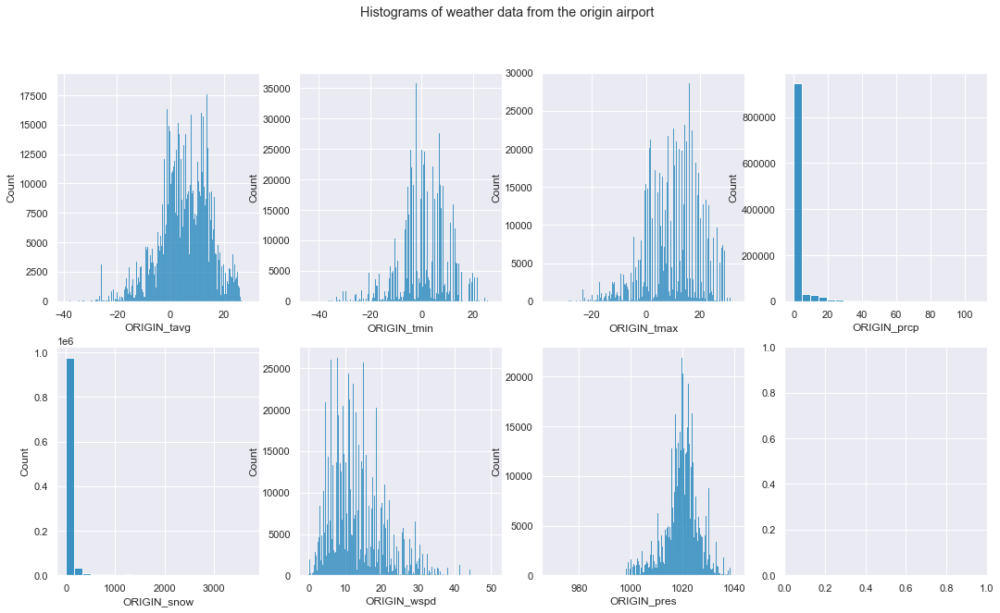

In [66]:
histplot_weather_data(org_weather)

plt.suptitle('Histograms of weather data from the origin airport')
plt.show()

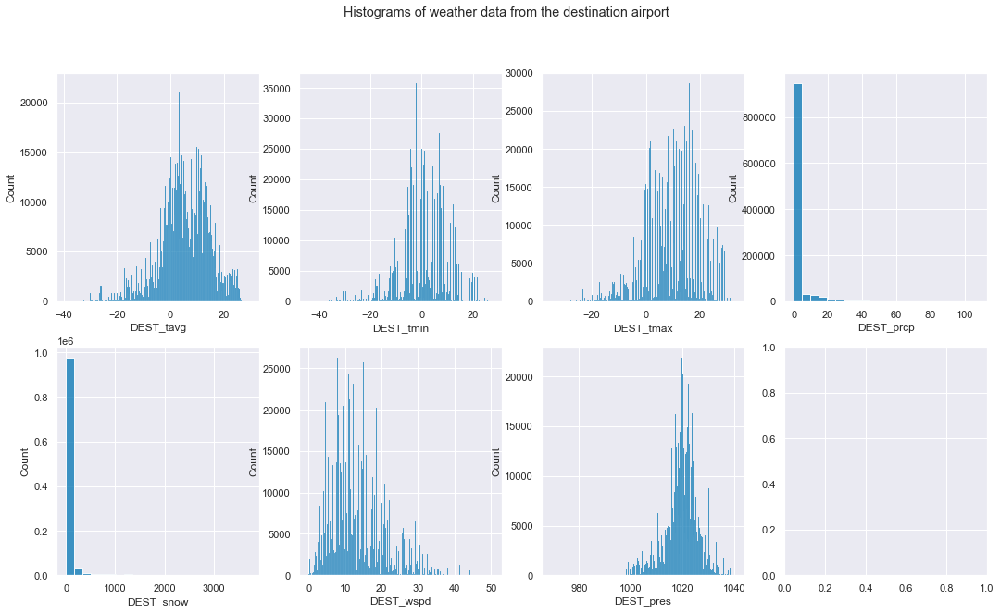

In [67]:
histplot_weather_data(dest_weather)

plt.suptitle('Histograms of weather data from the destination airport')
plt.show()

From the histograms of the weather data, we see that the snow and precipitation columns are positively skewed, so we apply a log transformation to make it closer to a normal distribution. To avoid log of 0, we add 1 to the values, as log(1) = 0

In [68]:
df['ORIGIN_prcp_log'] = np.log(df['ORIGIN_prcp'] + 1)
df['ORIGIN_snow_log'] = np.log(df['ORIGIN_snow'] + 1)

df['DEST_prcp_log'] = np.log(df['DEST_prcp'] + 1)
df['DEST_snow_log'] = np.log(df['DEST_snow'] + 1)

We redefine the columns to use log instead

In [69]:
org_weather = ['ORIGIN_tavg', 'ORIGIN_tmin', 'ORIGIN_tmax', 'ORIGIN_prcp_log', 'ORIGIN_snow_log', 'ORIGIN_wspd', 'ORIGIN_pres']
dest_weather = ['DEST_tavg', 'DEST_tmin', 'DEST_tmax', 'DEST_prcp_log', 'DEST_snow_log', 'DEST_wspd', 'DEST_pres']

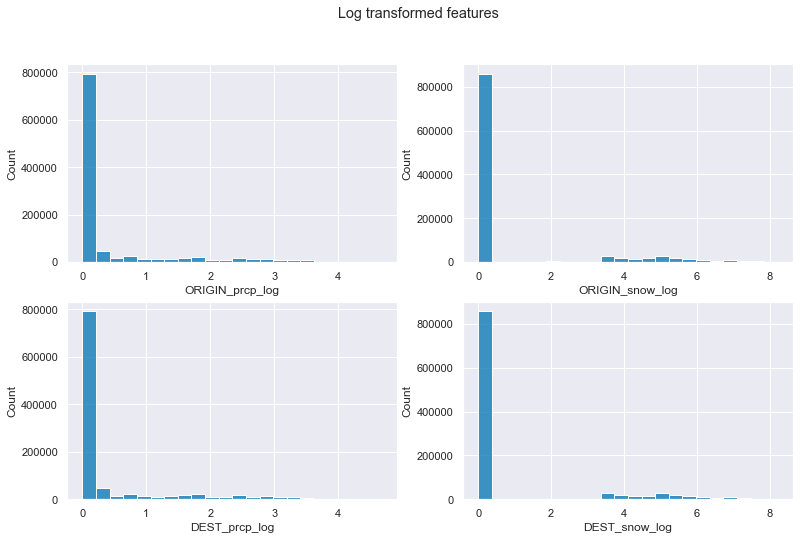

In [70]:
fig, axs = plt.subplots(2, 2, figsize=(13,8))

sns.histplot(data=df, x='ORIGIN_prcp_log', ax=axs[0, 0])
sns.histplot(data=df, x='ORIGIN_snow_log', ax=axs[0, 1])
sns.histplot(data=df, x='DEST_prcp_log', ax=axs[1, 0])
sns.histplot(data=df, x='DEST_snow_log', ax=axs[1, 1])

plt.suptitle('Log transformed features')
plt.show()


There are still plenty of values around 0, but it is more balanced on the scale.

Let's inspect the boxplot of the features to see difference of distributions for cancelled and delayed flights

In [71]:
def boxplot_weather_data(target, cols):
    i, j = 2,4
    
    fig, axs = plt.subplots(i, j, figsize=(18,10))
    
    idx = 0
    for i in range(i):
        for j in range(j):
            if idx >= len(cols):
                break
                
            sns.boxplot(data=df, x=target, y=cols[idx], ax=axs[i, j])
            idx += 1

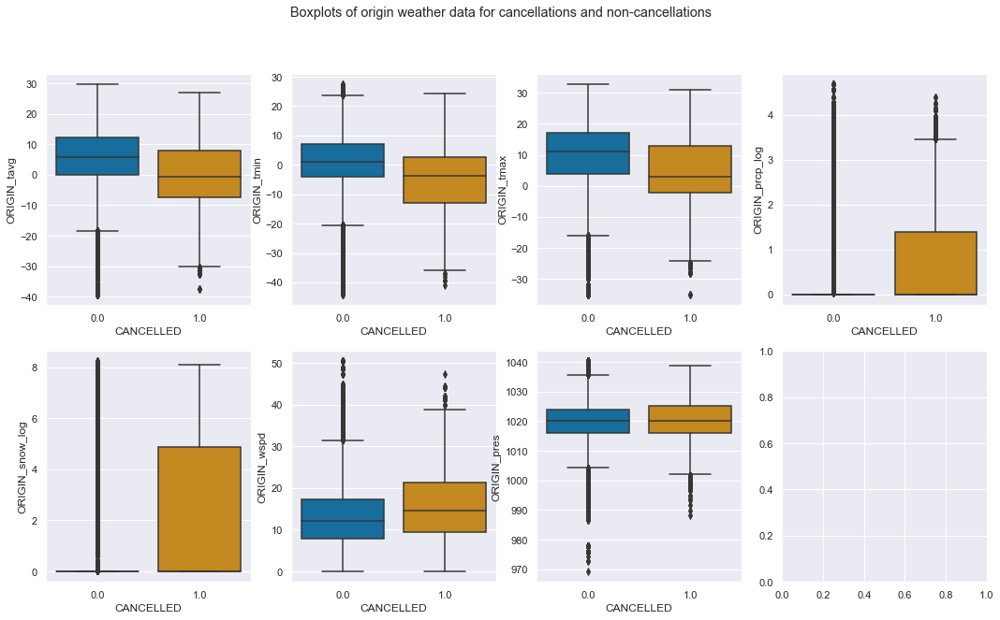

In [72]:
boxplot_weather_data('CANCELLED', org_weather)

plt.suptitle('Boxplots of origin weather data for cancellations and non-cancellations')
plt.show()

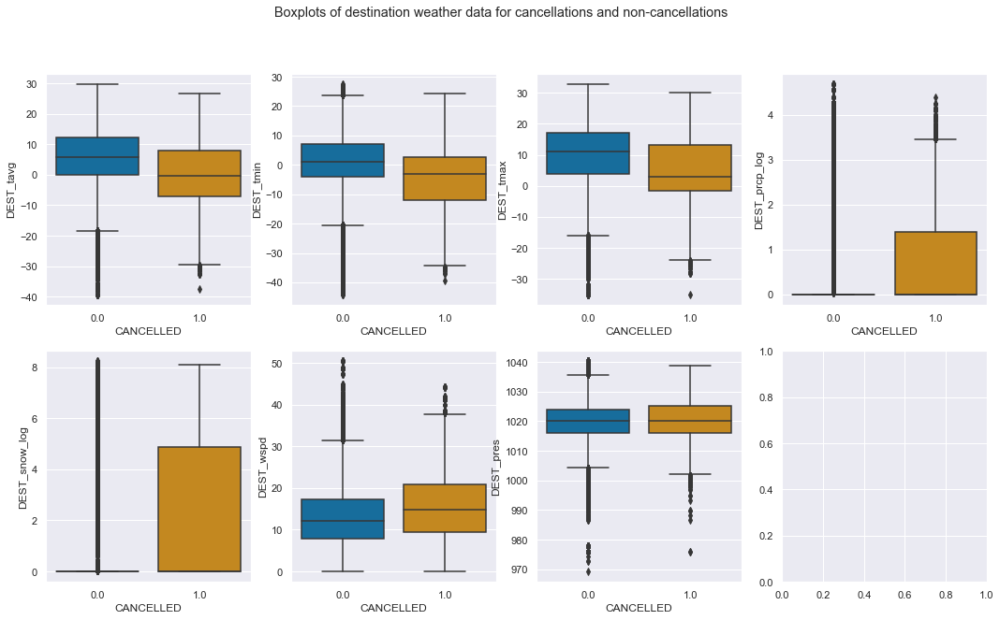

In [73]:
boxplot_weather_data('CANCELLED', dest_weather)

plt.suptitle('Boxplots of destination weather data for cancellations and non-cancellations')
plt.show()

For cancelled flights, it is clear that temperature, snow and precipitation are features to consider.

We only observe the origin weather data for delayed departures as destination weather data should not have an effect on this. The same logic is used for arrival delays (we only observe the destination weather data).

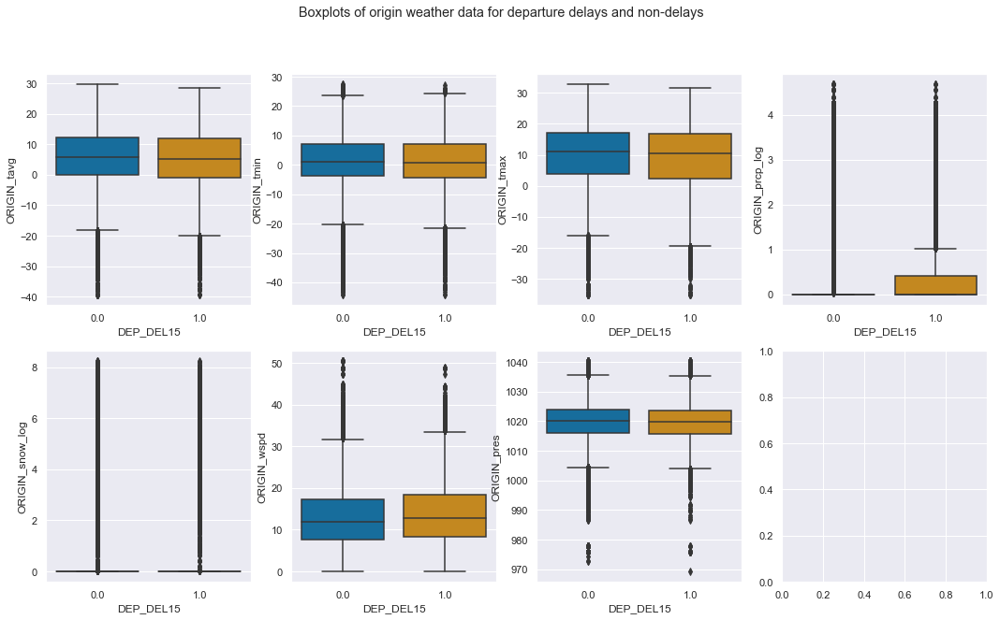

In [74]:
boxplot_weather_data('DEP_DEL15', org_weather)


plt.suptitle('Boxplots of origin weather data for departure delays and non-delays')
plt.show()

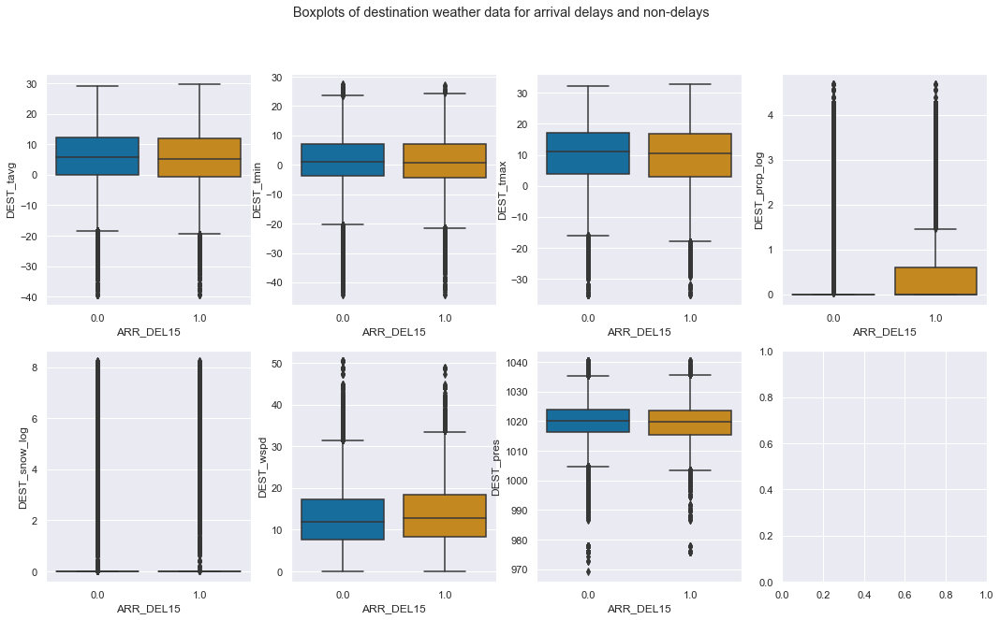

In [75]:
boxplot_weather_data('ARR_DEL15', dest_weather)


plt.suptitle('Boxplots of destination weather data for arrival delays and non-delays')
plt.show()

For delays, the weather data seems to not be differently distributed, with the exception of precipitation.

The differences in the boxplots found in cancellations are based on intuition and graphical interpretation. To properly validate if there is indeed a statistical significant difference, a t-test is performed on the features for cancellations and delays.

In [76]:
from scipy.stats import ttest_ind

In [77]:
def ttest_cat(df_yes, df_no, cols):
    for col in cols:
        print('=' * 10, col, '=' * 10)
        # Welsch t-test
        res = ttest_ind(df_yes[col], df_no[col], equal_var=False)
        print('p-value:', res.pvalue, '(significant)' if res.pvalue < 0.05 else '(not significant)')
        print('=' * 10, col, '=' * 10)
        print('')

In [78]:
df_cancel = df.query('CANCELLED == 1')
df_no_cancel = df.query('CANCELLED == 0')

In [79]:
ttest_cat(df_cancel, df_no_cancel, org_weather + dest_weather)

========== ORIGIN_tavg ==========
p-value: 0.0 (significant)
========== ORIGIN_tavg ==========

========== ORIGIN_tmin ==========
p-value: 0.0 (significant)
========== ORIGIN_tmin ==========

========== ORIGIN_tmax ==========
p-value: 0.0 (significant)
========== ORIGIN_tmax ==========

========== ORIGIN_prcp_log ==========
p-value: 0.0 (significant)
========== ORIGIN_prcp_log ==========

========== ORIGIN_snow_log ==========
p-value: 0.0 (significant)
========== ORIGIN_snow_log ==========

========== ORIGIN_wspd ==========
p-value: 0.0 (significant)
========== ORIGIN_wspd ==========

========== ORIGIN_pres ==========
p-value: 0.12665902461815376 (not significant)
========== ORIGIN_pres ==========

========== DEST_tavg ==========
p-value: 0.0 (significant)
========== DEST_tavg ==========

========== DEST_tmin ==========
p-value: 0.0 (significant)
========== DEST_tmin ==========

========== DEST_tmax ==========
p-value: 0.0 (significant)
========== DEST_tmax ==========

========== DEST_

These results are very interesting, and shows why plots might not always contain all the necessary information. The t-tests show that almost all the weather data features have a statistically significant difference in group means for cancellations.

In [80]:
df_arr_delay = df.query('ARR_DEL15 == 1')
df_no_arr_delay = df.query('ARR_DEL15 == 0')

df_dep_delay = df.query('DEP_DEL15 == 1')
df_no_dep_delay = df.query('DEP_DEL15 == 0')

In [81]:
ttest_cat(df_arr_delay, df_no_arr_delay, dest_weather)

========== DEST_tavg ==========
p-value: 1.3617566051230252e-122 (significant)
========== DEST_tavg ==========

========== DEST_tmin ==========
p-value: 1.6896776295754295e-63 (significant)
========== DEST_tmin ==========

========== DEST_tmax ==========
p-value: 3.352486671764285e-252 (significant)
========== DEST_tmax ==========

========== DEST_prcp_log ==========
p-value: 0.0 (significant)
========== DEST_prcp_log ==========

========== DEST_snow_log ==========
p-value: 8.039509652041549e-97 (significant)
========== DEST_snow_log ==========

========== DEST_wspd ==========
p-value: 0.0 (significant)
========== DEST_wspd ==========

========== DEST_pres ==========
p-value: 2.2598968578242168e-262 (significant)
========== DEST_pres ==========



In [82]:
ttest_cat(df_dep_delay, df_no_dep_delay, org_weather)

========== ORIGIN_tavg ==========
p-value: 4.456783987279663e-202 (significant)
========== ORIGIN_tavg ==========

========== ORIGIN_tmin ==========
p-value: 6.362853147838327e-131 (significant)
========== ORIGIN_tmin ==========

========== ORIGIN_tmax ==========
p-value: 0.0 (significant)
========== ORIGIN_tmax ==========

========== ORIGIN_prcp_log ==========
p-value: 0.0 (significant)
========== ORIGIN_prcp_log ==========

========== ORIGIN_snow_log ==========
p-value: 4.127214029499847e-192 (significant)
========== ORIGIN_snow_log ==========

========== ORIGIN_wspd ==========
p-value: 0.0 (significant)
========== ORIGIN_wspd ==========

========== ORIGIN_pres ==========
p-value: 4.79106712602984e-127 (significant)
========== ORIGIN_pres ==========



For delays, which seemed to have the same group means in the plots, the t-test shows statistically significant differences for all features.


In general, answering the question: **Do the weather conditions have an impact on the airline's activities? If so, which weather conditions are relevant?** 

Yes, weather conditions have a statistically significant impact on the airline's activities. While the boxplots show that mostly temperature, snow and precipitation have a large difference in distributions when it comes to the cancellations. It is actually the case, from the t-tests, that all features play a significant part when differentiating between cases of cancellations and delays.

## Airports that are more likely to cancel



In this section we wish to answer the following question: **Which airports are more likely to have cancellations?**

To answer to this question, we will focus on the cancellation data for both years, as well as, analyse if there's any correlation between cancellations and airports.


**Cancellation Counting**

Firstly, we will see the cancellation frequency distribution for 2019 and 2020.

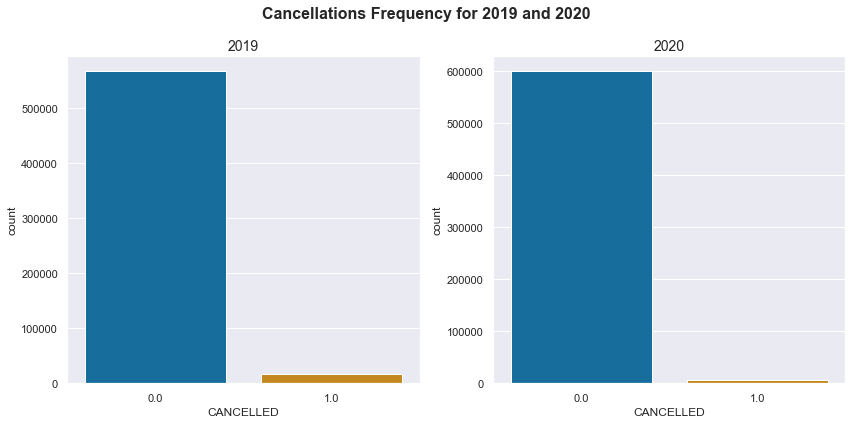

In [83]:
## 2019
fig, ax = plt.subplots(1,2, figsize=(12, 6))
bar_plot2019=sns.countplot(x="CANCELLED", data=df19_raw, ax=ax[0]).set_title('2019',fontdict= { 'fontsize': 14})

## 2020
bar_plot2020=sns.countplot(x='CANCELLED', data=df20_raw, ax=ax[1]).set_title('2020',fontdict= { 'fontsize': 14})

plt.suptitle("Cancellations Frequency for 2019 and 2020", fontsize= 16, fontweight="bold")

fig.tight_layout()
plt.show()

On a first sight, it seems that the for 2019 there where more cancellations than for 2020, even though the number of total flights in 2020 were slightly bigger. In order to get a deeper understanding, let's get some number of cancellations for both years. Moreover, the cancellation variable is considerable imbalanced, this is something that we will have to take into account later in our predictive models.

In [84]:
#Cancellation percentage 2019
canfreq19=df19_raw['CANCELLED'].value_counts(normalize= True)*100
#print(canfreq19)
#Cancellation percentage 2020
canfreq20=df20_raw['CANCELLED'].value_counts(normalize= True)*100
#canfreq20

In [85]:
#Let's create something that can be printed
can19=canfreq19.to_frame().T
can19=can19.rename(columns={0.0: 'Non Cancelled', 1.0 : 'Cancelled'}, index={'CANCELLED': '2019'})
can20=canfreq20.to_frame().T
can20=can20.rename(columns={0.0: 'Non Cancelled', 1.0 : 'Cancelled'}, index={'CANCELLED': '2020'})
#joining two dataframes
can19=can19.append(can20)
can19.head()

,Non Cancelled,Cancelled
2019,97.135885,2.864115
2020,98.862484,1.137516


Our first impression of the data was right, and evidently for 2019 the cancellation percentage was higher than for 2020, even though for January 2020 the total number of flights was higher than in January 2019. Could this be related to different weather conditions? 

Let's investigate further.



**Cancellations by Airport**

We will display which are the airports with most cancellations for 2019 and 2020, hopefully this will bring more insights to our analysis!


In [86]:
## Inspired by the code from https://www.kaggle.com/brunovinicius154/predicting-the-delay-of-flights-auc-0-88
badairport19=df19_raw[['ORIGIN','CANCELLED']].groupby('ORIGIN').sum().sort_values(by='CANCELLED',ascending=False)
#Let's add percentage calculation
badairport19['PERCENTAGE']=badairport19['CANCELLED']/(badairport19['CANCELLED'].sum())*100
#The top 5 airport in cancellations
badairport19.head(n=5)

,CANCELLED,PERCENTAGE
ORIGIN,,
ORD,2816.0,16.836064
MDW,781.0,4.669377
BOS,702.0,4.197058
DCA,633.0,3.784527
SFO,574.0,3.431783


The airport with most cancellations in 2019 was Chicago O'Hare International Airport, being followed by Chicago Midway International Airport and Boston Logan International Airport. Curiosly, the top two are located in the state of Illinois.

In [87]:
badairport20=df20_raw[['ORIGIN','CANCELLED']].groupby('ORIGIN').sum().sort_values(by='CANCELLED',ascending=False)
#Let's add percentage calculation
badairport20['PERCENTAGE']=badairport20['CANCELLED']/(badairport20['CANCELLED'].sum())*100
#The top 5 airport in cancellations
badairport20.head(n=5)

,CANCELLED,PERCENTAGE
ORIGIN,,
ORD,833.0,12.074214
DFW,466.0,6.754602
MDW,301.0,4.362951
DAL,200.0,2.898971
DEN,200.0,2.898971


Again, the airport with most cancellation in 2020 was Chicago O'Hare International Airport, being followed by Dallas Fort Worth International Airport. Remarkably, Chicago Midway International Airport has a very similar cancellation rate compared to previous year. Either way, again 2 out of the top 3 airport with most cancellations are located in Illinois, more precisely in the Chicago metropolitan area. 

**Correlation Analysis**

The previous study has shown that for the two years, Chicago' airports has shown an issue in regards to cancellations, suggesting that there could be a correlation between those airports and the cancellation rate. Nonetheless, to avoid the well-known *jumping into conclusions*, we will perform a correlation study, to assess if wether the airport itself could be a cause for a cancellation event.

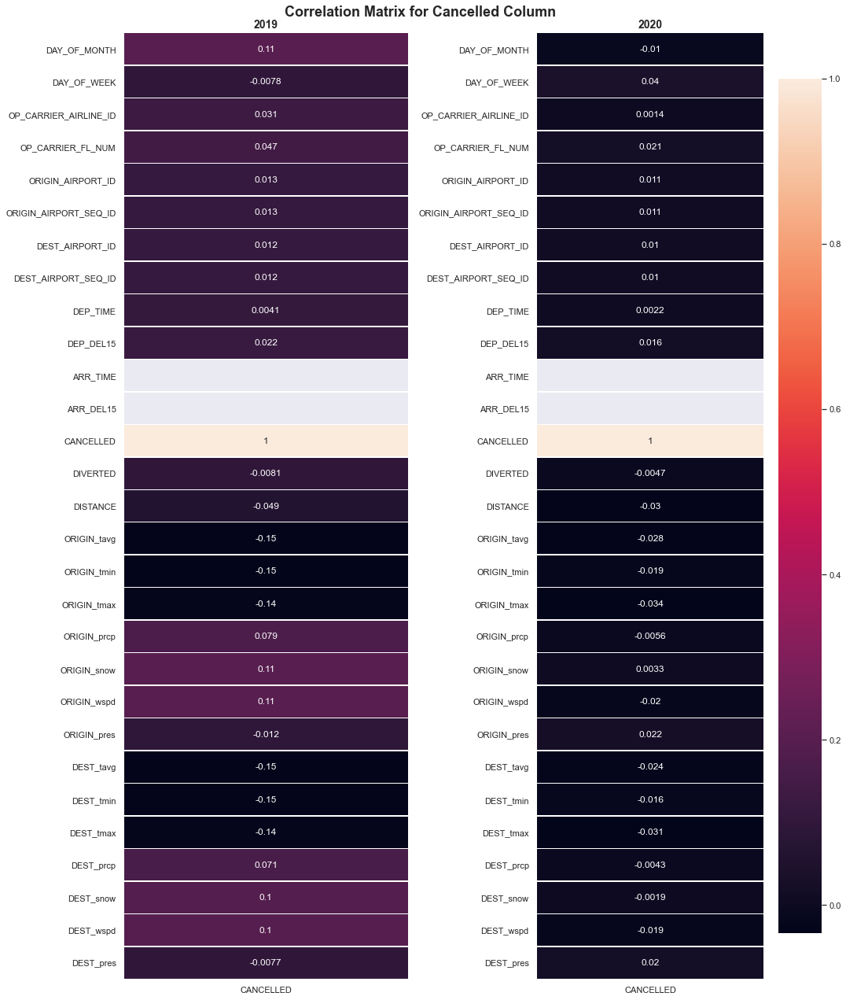

In [88]:
#Let's do a quick correlation matrix to see the impact of each column into the cancellation for year 2019
f, ax= plt.subplots(1, 2, figsize=(15,18))

corr19=df19_raw.corr()
#We want to focus on the cancelled row
corr19=corr19.loc['CANCELLED':'CANCELLED',:].T
sns.heatmap(corr19, linewidths=.5, annot= True, fmt='.2g', ax=ax[0], cbar=False).set_title('2019',fontdict= {'fontsize': 14, 'fontweight':"bold"})

corr20=df20_raw.corr()
corr20=corr20.loc['CANCELLED':'CANCELLED',:].T
sns.heatmap(corr20, linewidths=.5, annot= True, fmt='.2g', ax=ax[1]).set_title('2020',fontdict= { 'fontsize': 14, 'fontweight':"bold"})

plt.suptitle("Correlation Matrix for Cancelled Column", fontsize= 18, fontweight="bold")
plt.tight_layout()

plt.show()

Indeed, the correlation matrix throws us interesting insights, it shows us that despite our first expectations, it seems that there is not a strong correlation between the cancellations and the destiny nor origin airports. Moreover, it can be also appreciated that the origin and destiny weather conditions don't have a strong impact on the cancellations either. Then, why for both years the airports with the most cancellations are located in Chicago? A possible answer to that could be the extraordinary adverse weather events that hit Chicago in January 2019, and that caused the cancellation of thousands of flights.


Summarizing, it is concluded that despite the preliminary assumptions, the airports cannot be seen as a cause for a cancellation event. Moreover, it was found that extreme events of unpredictable nature, such as snowstorms, strikes, etc... happening in the airport area would have a huge impact on the normal functioning of an airport, and that would be those events the most probable cause of a cancellation, rather than the airport itself.